# Music Recommendation

# Table of Contents
- [Overview](#Overview)
- [Importing Data](#importing-data)
  - [Explaining Variables](#explaining-variables)
- [Data Cleaning](#data-cleaning)
  - [Removing Rows with Missing Values](#removing-rows-with-missing-values)
  - [Checking the Data Type for Each Column](#checking-the-data-type-for-each-column)
- [Preparation](#Preparation)
  - [Now We Are Done with Cleaning the Data, Time to Prepare the Data to Train](#now-we-are-done-with-cleaning-the-data-time-to-prepare-the-data-to-train)
  - [We Will Use K-Clustering to Help Us Classify the Songs Quickly](#we-will-use-k-clustering-to-help-us-classify-the-songs-quickly)
  - [Saving Processed Data](#saving-processed-data)
  - [Examining the K-Clusters](#examining-the-k-clusters)
  - [Examining the Quality of Our Cluster and Categorization](#examining-the-quality-of-our-cluster-and-categorization)
  - [Improving Our Silhouette Score](#improving-our-silhouette-score)
  - [Analyze Results](#analyze-results)
  - [Making Sense](#making-sense)
  - [Analyzing Further](#analyzing-further)
- [Training](#training)
  - [Forest Model](#forest-model)
    - [Hypertuning Forest](#hypertuning-forest)
  - [Neural Network MLP](#neural-network-mlp)
    - [Hypertuning MLP](#hypertuning-mlp)
- [Saving and Loading Model](#Saving-and-Loading-the-Model)
- [Testing](#testing)


## Overview 

This project aims to develop a machine learning model that classifies songs into different emotional categories based on audio features. The dataset consists of songs with features such as valence, energy, danceability, loudness, and tempo, which influence the perceived emotional tone. By utilizing clustering techniques and classification models (Random Forest and MLP), the goal is to predict emotions like "Energetic," "Joyful," "Calm," "Sad," and "Angry" for each song. This classification can later be used for personalized song recommendations based on mood or emotional preferences.

**It is important to note that the model does not analyze lyrics or vocals; it only considers the audio features mentioned above.**

## Importing Data

In [1]:
import pandas as pd

#loading the data set
df = pd.read_csv("SpotifyDataset/spotify_songs.csv")
df.head()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,189052


### Explaning variables


| Keywords      | Values |  Description     |
| :---        |    :----:   |          ---: |
| danceability      | 0 - 1.0       | Danceability describes how suitable a track is for dancing with value of 0.0 is least danceable and 1.0 is most danceable.|
| energy   | 0 - 1.0        | Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity. Typically, energetic tracks feel fast, loud, and noisy|
| key      | Double       | The estimated overall key of the track. Integers map to pitches using standard Pitch Class notation . E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on. If no key was detected, the value is -1.   |
| loudness   | -60-0        | The overall loudness of a track in decibels (dB). Loudness values are averaged across the entire track and are useful for comparing relative loudness of tracks. Loudness is the quality of a sound that is the primary psychological correlate of physical strength (amplitude). Values typical range between -60 and 0 db.     |
| mode      | 0-1       | Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0.   |
| speechiness   | Double        | Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value. Values above 0.66 describe tracks that are probably made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. Values below 0.33 most likely represent music and other non-speech-like tracks.     |
| acousticness      | 0 - 1.0      | A confidence measure from 0.0 to 1.0 of whether the track is acoustic. 1.0 represents high confidence the track is acoustic.   |
| instrumentalness   | Double       | Predicts whether a track contains no vocals. "Ooh" and "aah" sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly "vocal". The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content. Values above 0.5 are intended to represent instrumental tracks, but confidence is higher as the value approaches 1.0.     |
| liveness      | Double      | Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live. A value above 0.8 provides strong likelihood that the track is live.   |
| valence   | 0 - 1.0        | A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry).      |
| tempo      | Double      | The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration.   |
| duration_ms   | Double        | Duration of song in milliseconds      |

Table and dataset taking from https://www.kaggle.com/datasets/maharshipandya/-spotify-tracks-dataset/data

## Data Cleaning

In [2]:
#looking for missing data

print(df.isnull().sum())

track_id                    0
track_name                  5
track_artist                5
track_popularity            0
track_album_id              0
track_album_name            5
track_album_release_date    0
playlist_name               0
playlist_id                 0
playlist_genre              0
playlist_subgenre           0
danceability                0
energy                      0
key                         0
loudness                    0
mode                        0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
duration_ms                 0
dtype: int64


## Removing Rows with Missing Values



In [3]:
# Drop rows with any missing values
df = df.dropna()

# Verify that there are no more missing values
print(df.isnull().sum())

# Check the updated size of the dataset
print(f"Number of rows after removing missing values: {df.shape[0]}")


track_id                    0
track_name                  0
track_artist                0
track_popularity            0
track_album_id              0
track_album_name            0
track_album_release_date    0
playlist_name               0
playlist_id                 0
playlist_genre              0
playlist_subgenre           0
danceability                0
energy                      0
key                         0
loudness                    0
mode                        0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
duration_ms                 0
dtype: int64
Number of rows after removing missing values: 32828


## Checking the data type for each column

In [4]:
df.dtypes

track_id                     object
track_name                   object
track_artist                 object
track_popularity              int64
track_album_id               object
track_album_name             object
track_album_release_date     object
playlist_name                object
playlist_id                  object
playlist_genre               object
playlist_subgenre            object
danceability                float64
energy                      float64
key                           int64
loudness                    float64
mode                          int64
speechiness                 float64
acousticness                float64
instrumentalness            float64
liveness                    float64
valence                     float64
tempo                       float64
duration_ms                   int64
dtype: object

In [5]:
#check for dupllicated rows and if any remove them 
duplicated_rows = df.duplicated().sum()
print(duplicated_rows)
if duplicated_rows!=0:
    df.drop_duplicates()


0


## Preparation

We will classify the data before the training process. For this, we need to select different categories that will be useful for recommending songs accurately based on the user's emotions. For simplicity, we use default emotions that the user can choose from. Below is an example of variables that are likely to contribute to classifying a song based on its emotion. I predict the following associations between variables and emotions:

1. Joyful - High valence, energy, and danceability.
2. Sad - Low valence and energy.
3. Calm - Moderate valence, low energy, and low loudness.
4. Energetic - High energy and tempo, moderate valence.
5. Angry - Low valence, high energy

### We will use K-Clustering to help us classify the songs quickly.

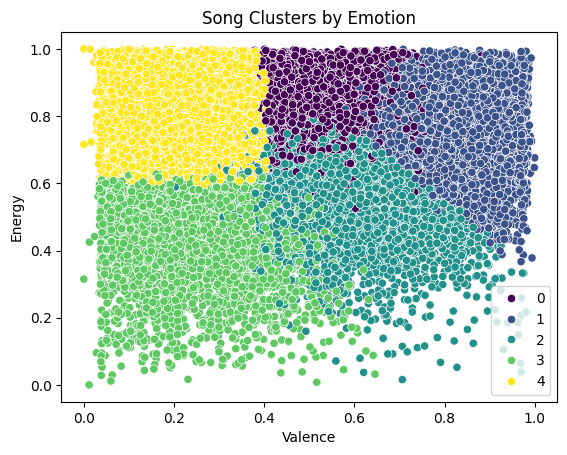

In [6]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
import matplotlib.pyplot as plt



# Select features
features = ['valence', 'energy', 'danceability', 'loudness', 'tempo']
df_features = df[features]

# Normalize features
scaler = MinMaxScaler()
normalized_data = scaler.fit_transform(df_features)


# Apply K-Means
#use 5 for clusters since we are observing 5 variables
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(normalized_data)

# Add cluster labels to dataset
df['emotion_cluster'] = clusters


# Example Visualize clusters
import seaborn as sns
sns.scatterplot(x=normalized_data[:, 0], y=normalized_data[:, 1], hue=clusters, palette='viridis')
plt.xlabel('Valence')
plt.ylabel('Energy')
plt.title('Song Clusters by Emotion')
plt.show()


### Saving Proccessed data.

In [7]:
import joblib

# Save preprocessed data and clustering model
df.to_csv("preprocessed_data.csv", index=False)
joblib.dump(scaler, 'minmax_scaler.pkl')  # Save the scaler
joblib.dump(kmeans, 'kmeans_model.pkl')  # Save the clustering model

#loading the data into variables
scaler = "minmax_scaler.pkl"
kmeans_path = "kmeans_model.pkl"
df_path = "preprocessed_dataframe.csv"

### Examing the K-clusters

We applied a k-means clustering technique to the graph to help classify the dataset more effectively and visualize an example of valence vs. energy. The graph looks good, and there is some overlapping, which is expected considering that some songs can exhibit a mix of different emotions, resulting in imperfect and indistinct boundaries.








In [8]:
# Group data by clusters and calculate feature means
cluster_summary = pd.DataFrame(data=normalized_data, columns=features)
cluster_summary['Cluster'] = kmeans.labels_
cluster_means = cluster_summary.groupby('Cluster').mean()

print(cluster_means)


          valence    energy  danceability  loudness     tempo
Cluster                                                      
0        0.550727  0.830376      0.581754  0.861508  0.541825
1        0.810146  0.768622      0.746998  0.844189  0.499412
2        0.564478  0.567334      0.764183  0.807609  0.469615
3        0.269011  0.435314      0.594407  0.767869  0.485511
4        0.250470  0.806265      0.601295  0.860896  0.525102


### Examing the quality of our cluster and categorization

In [9]:
from sklearn.metrics import silhouette_score

score = silhouette_score(normalized_data, kmeans.labels_)
print(f"Silhouette Score: {score:.2f}")


Silhouette Score: 0.21


#### Improving our Silhouette Score 
The goal is to improve our silhouette score as much as possible before we finally consider whether the score makes sense conceptually.








In [10]:
from sklearn.decomposition import PCA

# Apply PCA to reduce to 2 components
pca = PCA(n_components=2)
pca_result = pca.fit_transform(normalized_data)

# Add the principal components to the dataframe
df['PC1'] = pca_result[:, 0]
df['PC2'] = pca_result[:, 1]

# Display explained variance ratio for PCA components
print("Explained Variance Ratio:", pca.explained_variance_ratio_)



Explained Variance Ratio: [0.47558111 0.27755501]


The explained variance indicates how spread out our data is in the reduced-dimensional space. We have a variance of 0.47 from PC1 and 0.277 from PC2, with a total of approximately 75%. This means most of the data is represented in the reduced 2D space, with PC1 being the most informative dimension.

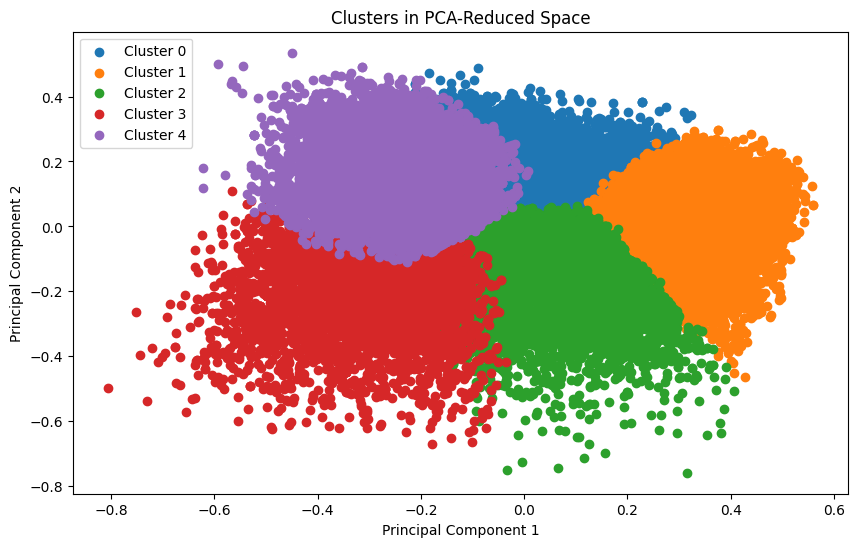

In [11]:
# Add the cluster labels to the dataframe
df['Cluster'] = kmeans.labels_

# Plot the clusters with their labels
plt.figure(figsize=(10, 6))
for cluster in range(5):  #5 clusters
    cluster_data = df[df['Cluster'] == cluster]
    plt.scatter(cluster_data['PC1'], cluster_data['PC2'], label=f'Cluster {cluster}')

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Clusters in PCA-Reduced Space')
plt.legend()
plt.show()

#### Analyze Results
This was expected; the graph retains most of the important features, but we need to analyze which variables are contributing the most to the PCA direction. We can analyze the loadings to inspect this.

In [12]:
# Get PCA loadings
loadings = pca.components_

# Create a dataframe of the loadings
features = ['valence', 'energy', 'danceability', 'loudness', 'tempo']
pca_loadings = pd.DataFrame(loadings, columns=features, index=['PC1', 'PC2'])

print(pca_loadings)


      valence    energy  danceability  loudness     tempo
PC1  0.938985  0.207813      0.270254  0.042428 -0.016834
PC2 -0.121554  0.904502     -0.297068  0.220886  0.173382


### Making sense
The value ranges from [-1, 1] in the PCA values, and we have two principal components that tell us which variable is affecting it the most.

In PC1, valence has the highest negative influence, indicating that PC1 is heavily tied to the emotional positivity of a song. Songs with lower values represent sad, depressing songs. The other variables don't have as much influence as valence, with loudness and tempo minimally affecting PC1, but they are not the dominant driving features.

In PC2, energy has the highest negative influence, showing that PC2 is tied to the intensity and activity of the song. The other variables have less influence.

Songs with:

Low PC1 & Low PC2: Likely sad, calm tracks.
High PC1 & Low PC2: Likely happy, calm tracks.
Low PC1 & High PC2: Likely sad, intense tracks.
High PC1 & High PC2: Likely happy, intense tracks.

In [13]:
# Map emotion labels to clusters
cluster_labels = {
    0: "Energetic",
    1: "Joyful",
    2: "Calm",
    3: "Sad",
    4: "Angry"
}

# Assign labels
cluster_summary['Emotion'] = cluster_summary['Cluster'].map(cluster_labels)

#count of each song in the cluster
cluster_counts =  cluster_summary['Emotion'].value_counts()
print(cluster_counts)

Emotion
Joyful       7804
Calm         7093
Energetic    6694
Angry        6630
Sad          4607
Name: count, dtype: int64


### Analyzing further
Obtaining an 'importance' level that tells us which variables contribute the most to distinct clusters is important. From the findings, valence and energy play the most significant roles. Loudness is the least important, with a very low value of 0.05. Given that loudness is so low, this variable can be dropped in the further process.

Feature: valence, Importance: 0.51
Feature: energy, Importance: 0.27
Feature: danceability, Importance: 0.13
Feature: loudness, Importance: 0.05
Feature: tempo, Importance: 0.04


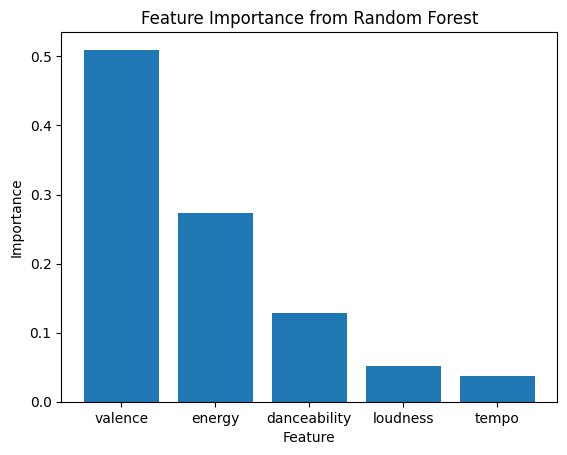

In [14]:
from sklearn.ensemble import RandomForestClassifier

X = normalized_data
y = kmeans.labels_  # Cluster labels from k-means

# Train Random Forest
rf = RandomForestClassifier(random_state=42)
rf.fit(X, y)

feature_importances = rf.feature_importances_
feature_names = ['valence', 'energy', 'danceability', 'loudness', 'tempo']

# Display results
for name, importance in zip(feature_names, feature_importances):
    print(f"Feature: {name}, Importance: {importance:.2f}")


plt.bar(feature_names, feature_importances)
plt.title("Feature Importance from Random Forest")
plt.ylabel("Importance")
plt.xlabel("Feature")
plt.show()



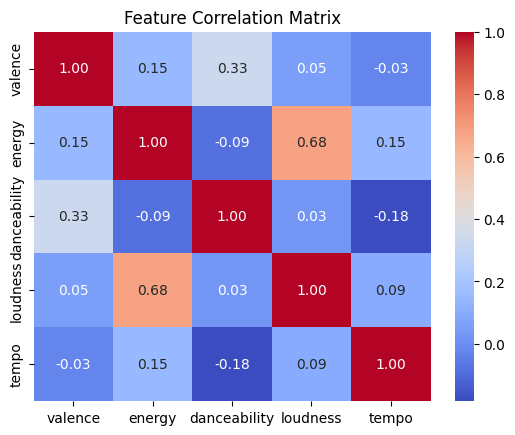

In [15]:
import pandas as pd
import seaborn as sns

# Convert the numpy array back to a DataFrame
columns = ['valence', 'energy', 'danceability', 'loudness', 'tempo']  #feature names
normalized_df = pd.DataFrame(normalized_data, columns=columns)

# Compute pairwise correlation
corr_matrix = normalized_df.corr()

# Visualize the correlation matrix
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Feature Correlation Matrix")
plt.show()


### Training
Time to train the data now that I have explored the dataset through different technique for emotional classification for the song.


#### Forest Model

In [16]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Input features (X) and target labels (y)
X = normalized_data  # preprocessed feature set
y = cluster_summary['Emotion'] # assigned emotional categories

# Train-test-validation split (60% training, 20% validation, 20% test)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)


# Encode the target labels
encoder = LabelEncoder()
y_train_encoded = encoder.fit_transform(y_train)
y_test_encoded = encoder.transform(y_test)




In [17]:
from sklearn.ensemble import RandomForestClassifier

# Initialize the model
clf = RandomForestClassifier(random_state=42, n_estimators=200,max_depth=None,min_samples_split=2)

# Train the model
clf.fit(X_train, y_train)


RandomForestClassifier(n_estimators=200, random_state=42)

Accuracy: 0.9763935424916235
              precision    recall  f1-score   support

       Angry       0.98      1.00      0.99      1348
        Calm       0.97      0.97      0.97      1432
   Energetic       0.98      0.97      0.97      1400
      Joyful       0.98      0.97      0.98      1483
         Sad       0.98      0.98      0.98       903

    accuracy                           0.98      6566
   macro avg       0.98      0.98      0.98      6566
weighted avg       0.98      0.98      0.98      6566



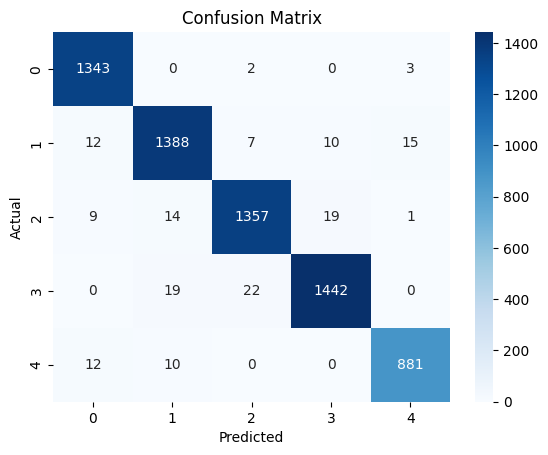

In [18]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Make predictions
y_pred = clf.predict(X_test)

# Accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

# Detailed classification report
print(classification_report(y_test, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


### Hypertuning Paramaters Forest Model

In [19]:
# from sklearn.model_selection import GridSearchCV

# # Define parameter grid, simplify paramter removed other test
# param_grid = {
#     'n_estimators': [100, 200],
#     'max_depth': [None, 10, 20],
#     'min_samples_split': [2, 5]
# }

# # Initialize GridSearch
# grid_search = GridSearchCV(RandomForestClassifier(random_state=42), param_grid, cv=5, scoring='accuracy')

# # Fit GridSearch
# grid_search.fit(X_train, y_train)

# # Best parameters and accuracy
# print("Best Parameters:", grid_search.best_params_)
# print("Best Score:", grid_search.best_score_)


Best Parameters: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}
Best Score: 0.9749693614421965


In [21]:
#Save the trained model
joblib.dump(clf, 'song_emotion_classifier_forest_model.pkl')

#Load the model later if we need it
clf = joblib.load('song_emotion_classifier_forest_model.pkl')


### Neural Network MLP

Epoch [100/5000], Loss: 1.0946, Val Loss: 1.0923
Epoch [200/5000], Loss: 0.9980, Val Loss: 0.9965
Epoch [300/5000], Loss: 0.9697, Val Loss: 0.9682
Epoch [400/5000], Loss: 0.9557, Val Loss: 0.9543
Epoch [500/5000], Loss: 0.9472, Val Loss: 0.9458
Epoch [600/5000], Loss: 0.9414, Val Loss: 0.9401
Epoch [700/5000], Loss: 0.9372, Val Loss: 0.9359
Epoch [800/5000], Loss: 0.9340, Val Loss: 0.9328
Epoch [900/5000], Loss: 0.9314, Val Loss: 0.9302
Epoch [1000/5000], Loss: 0.9293, Val Loss: 0.9282
Epoch [1100/5000], Loss: 0.9275, Val Loss: 0.9265
Epoch [1200/5000], Loss: 0.9260, Val Loss: 0.9250
Epoch [1300/5000], Loss: 0.9247, Val Loss: 0.9236
Epoch [1400/5000], Loss: 0.9236, Val Loss: 0.9229
Epoch [1500/5000], Loss: 0.9226, Val Loss: 0.9218
Epoch [1600/5000], Loss: 0.9218, Val Loss: 0.9209
Epoch [1700/5000], Loss: 0.9210, Val Loss: 0.9202
Epoch [1800/5000], Loss: 0.9203, Val Loss: 0.9196
Epoch [1900/5000], Loss: 0.9196, Val Loss: 0.9188
Epoch [2000/5000], Loss: 0.9190, Val Loss: 0.9182
Epoch [21

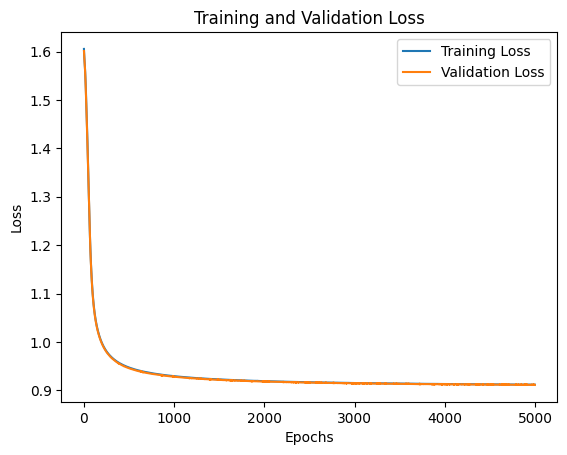

Accuracy: 0.9984770027413951


In [20]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# Neural network model
class EmotionNet(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(EmotionNet, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, output_size)
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        x = self.softmax(x)
        return x

# Hyperparameters
input_size = 5  # Number of features
hidden_size = 32  #tuned 
output_size = 5  # Number of emotions
learning_rate = 0.01 #tuned
epochs = 5000

# Splitting data into train, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Encode the target labels
encoder = LabelEncoder()
y_train_encoded = encoder.fit_transform(y_train)
y_val_encoded = encoder.transform(y_val)
y_test_encoded = encoder.transform(y_test)

# Initialize the model, loss function, and optimizer
model = EmotionNet(input_size, hidden_size, output_size)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Converting  data to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train_encoded, dtype=torch.long)

X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val_encoded, dtype=torch.long)

X_test_tensor = torch.tensor(X_test, dtype=torch.float32)

# Track the loss for plotting
train_losses = []
val_losses = []

# Training loop
for epoch in range(epochs):
    model.train()
    
    # Forward pass
    outputs = model(X_train_tensor)
    loss = criterion(outputs, y_train_tensor)

    # Backward pass and optimization
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    # Store the training loss
    train_losses.append(loss.item())

    # Validation loss
    model.eval()
    with torch.no_grad():
        val_outputs = model(X_val_tensor)
        val_loss = criterion(val_outputs, y_val_tensor)
    
    val_losses.append(val_loss.item())

    if (epoch+1) % 100 == 0:
        print(f"Epoch [{epoch+1}/{epochs}], Loss: {loss.item():.4f}, Val Loss: {val_loss.item():.4f}")

# Plotting the training and validation loss
plt.plot(range(epochs), train_losses, label='Training Loss')
plt.plot(range(epochs), val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

# After training, make predictions on the test set
model.eval()
y_pred = model(X_test_tensor).argmax(dim=1).numpy()

# Compute accuracy
accuracy = accuracy_score(y_test_encoded, y_pred)
print(f"Accuracy: {accuracy}")


In [ ]:
# from sklearn.base import BaseEstimator
# from sklearn.neural_network import MLPClassifier
# from sklearn.model_selection import GridSearchCV
# import torch
# import torch.nn as nn
# import torch.optim as optim
# from sklearn.preprocessing import LabelEncoder
# from sklearn.metrics import accuracy_score
# import numpy as np
# from sklearn.model_selection import train_test_split

# # Neural network model
# class EmotionNet(nn.Module):
#     def __init__(self, input_size, hidden_size, output_size):
#         super(EmotionNet, self).__init__()
#         self.fc1 = nn.Linear(input_size, hidden_size)
#         self.relu = nn.ReLU()
#         self.fc2 = nn.Linear(hidden_size, output_size)
#         self.softmax = nn.Softmax(dim=1)

#     def forward(self, x):
#         x = self.fc1(x)
#         x = self.relu(x)
#         x = self.fc2(x)
#         x = self.softmax(x)
#         return x

# # Wrapper class to use PyTorch model in GridSearchCV
# class MLPWrapper(BaseEstimator):
#     def __init__(self, input_size, hidden_size, output_size, learning_rate=0.001, epochs=100):
#         self.input_size = input_size
#         self.hidden_size = hidden_size
#         self.output_size = output_size
#         self.learning_rate = learning_rate
#         self.epochs = epochs

#     def fit(self, X, y):
#         # Convert X and y to PyTorch tensors
#         X_tensor = torch.tensor(X, dtype=torch.float32)
#         y_tensor = torch.tensor(y, dtype=torch.long)

#         # Initialize the model, loss function, and optimizer
#         self.model = EmotionNet(self.input_size, self.hidden_size, self.output_size)
#         self.criterion = nn.CrossEntropyLoss()
#         self.optimizer = optim.Adam(self.model.parameters(), lr=self.learning_rate)

#         # Training loop
#         for epoch in range(self.epochs):
#             self.model.train()
#             outputs = self.model(X_tensor)
#             loss = self.criterion(outputs, y_tensor)

#             # Backward pass and optimization
#             self.optimizer.zero_grad()
#             loss.backward()
#             self.optimizer.step()

#         return self

#     def predict(self, X):
#         self.model.eval()
#         X_tensor = torch.tensor(X, dtype=torch.float32)
#         y_pred = self.model(X_tensor).argmax(dim=1).numpy()
#         return y_pred

# # Define hyperparameter grid for GridSearchCV
# param_grid = {
#     'hidden_size': [32, 64],
#     'learning_rate': [0.01],
#     'epochs': [100,500,1000,5000]
# }

# # Prepare data
# X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=42)
# X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# # Encode target labels
# encoder = LabelEncoder()
# y_train_encoded = encoder.fit_transform(y_train)
# y_val_encoded = encoder.transform(y_val)
# y_test_encoded = encoder.transform(y_test)

# # Initialize the MLPWrapper and GridSearchCV
# mlp_wrapper = MLPWrapper(input_size=X_train.shape[1], hidden_size=64, output_size=len(encoder.classes_))
# grid_search = GridSearchCV(mlp_wrapper, param_grid, cv=3, scoring='accuracy', n_jobs=-1)

# # Fit GridSearchCV
# grid_search.fit(X_train, y_train_encoded)

# # Best parameters and score
# print("Best Parameters:", grid_search.best_params_)
# print("Best Score:", grid_search.best_score_)

# # Make predictions with the best model
# best_model = grid_search.best_estimator_
# y_pred = best_model.predict(X_test)

# # Compute accuracy
# accuracy = accuracy_score(y_test_encoded, y_pred)
# print(f"Test Accuracy: {accuracy}")


### Saving and Loading the Model


In [25]:
torch.save(model.state_dict(), 'emotion_model.pth') #save the model to pth file
def load_model(model_class, model_path, input_size, hidden_size, output_size):
    model = model_class(input_size, hidden_size, output_size)
    model.load_state_dict(torch.load(model_path, weights_only=True)) 
    model.eval()  # Set to evaluation mode
    return model

# Example usage:
input_size = 5
hidden_size = 32
output_size = 5
model = load_model(EmotionNet, 'emotion_model.pth', input_size, hidden_size, output_size)



## Testing

In [26]:
import numpy as np
import torch
from sklearn.preprocessing import LabelEncoder
import joblib

# Load the scaler
scaler = joblib.load('minmax_scaler.pkl')

# Define emotion to label mapping
emotion_to_label = {'Angry': 0, 'Calm': 1, 'Energetic': 2, 'Joyful': 3, 'Sad': 4}

def predict_emotion(user_mood):
    # Map user input to emotion label (numeric encoding)
    emotion_map = {
        "Energetic": [0.550727, 0.830376, 0.581754, 0.861508, 0.541825],
        "Joyful": [0.810146, 0.768622, 0.746998, 0.844189, 0.499412],
        "Calm": [0.564478, 0.567334, 0.764183, 0.807609, 0.469615],
        "Sad": [0.269011, 0.435314, 0.594407, 0.767869, 0.485511],
        "Angry": [0.250470, 0.806265, 0.601295, 0.860896, 0.525102]
    }

    # Get the corresponding feature vector for the selected emotion
    emotion_label = emotion_map.get(user_mood, None)
    if emotion_label is None:
        print("Invalid emotion selected!")
        return None

    # Convert the emotion features into a numpy array and then into a torch tensor
    emotion_input = np.array([emotion_label])
    emotion_input_tensor = torch.tensor(emotion_input, dtype=torch.float32)

    # Make prediction using the model
    with torch.no_grad():
        outputs = model(emotion_input_tensor)  # Forward pass
        emotion_pred = outputs.argmax(dim=1).numpy()  # Get the predicted class
    predicted_emotion = encoder.inverse_transform(emotion_pred)
    return predicted_emotion[0]

def assign_emotion_to_songs(df, model, encoder):
    for _, row in df.iterrows():
        # Extract features
        features = np.array([row[['valence', 'energy', 'danceability', 'loudness', 'tempo']].values], dtype=np.float32)
        print(f"Input features: {features}")  # Debug statement
        
        # Normalize features using the saved scaler
        normalized_features = scaler.transform(features)
        features_tensor = torch.tensor(normalized_features, dtype=torch.float32)
        
        # Predict emotion
        with torch.no_grad():
            outputs = model(features_tensor)  # Forward pass
            pred = outputs.argmax(dim=1).numpy()  # Get the predicted class
        predicted_emotion = encoder.inverse_transform(pred)
        
        print(f"Prediction (encoded): {pred}")  # Debug statement
        print(f"Predicted Emotion (decoded): {predicted_emotion}")  # Debug statement
        
        # Assign predicted emotion to the dataframe
        df.at[_, 'emotion'] = predicted_emotion[0]
        print(f"Assigned Emotion for {row['track_name']}: {predicted_emotion[0]}")
    print("Emotion assignment complete.")
    return df

# Assign emotions to songs in the dataframe
df = assign_emotion_to_songs(df, model, encoder)


Input features: [[  0.518   0.916   0.748  -2.634 122.036]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for I Don't Care (with Justin Bieber) - Loud Luxury Remix: Energetic
Input features: [[ 0.693  0.815  0.726 -4.969 99.972]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Memories - Dillon Francis Remix: Joyful
Input features: [[  0.613   0.931   0.675  -3.432 124.008]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for All the Time - Don Diablo Remix: Energetic
Input features: [[  0.277   0.93    0.718  -3.778 121.956]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Call You Mine - Keanu Silva Remix: Angry
Input features: [[  0.725   0.833   0.65   -4.672 123.976]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Someone You Loved - Future Humans Remix: Joyful
Input features: [[  0.585   

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Flames: Angry
Input features: [[ 0.41   0.76   0.654 -3.669 99.945]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Sorry: Angry
Input features: [[  0.465   0.928   0.63   -2.787 123.963]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for This Is What You Came For: Energetic
Input features: [[  0.643   0.783   0.532  -5.697 124.08 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Wake Me Up: Energetic
Input features: [[  0.163   0.77    0.694  -5.335 125.905]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for In My Mind: Angry
Input features: [[  0.301   0.787   0.604  -3.674 126.062]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Titanium (feat. Sia): Angry
Input features: [[  0.193   0.74    0.432  -5.053

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Million Lights: Energetic
Input features: [[  0.187   0.617   0.659  -5.862 119.858]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Dancing in the Moonlight: Angry
Input features: [[  0.516   0.873   0.592  -5.65  122.011]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Heaven: Energetic
Input features: [[  0.591   0.617   0.651  -6.077 121.977]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Forever Young: Calm
Input features: [[  0.277   0.585   0.707 -11.024 125.161]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for eoh: Sad
Input features: [[ 0.524  0.687  0.673 -5.295 96.964]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Nobody: Calm
Input features: [[  0.541   0.765   0.567  -4.107 121.924]]
Predict

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for I don’t wanna do: Joyful
Input features: [[  0.266   0.8     0.718  -5.715 117.98 ]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for A-RA-SHI:Reborn: Angry
Input features: [[  0.5     0.673   0.775  -6.526 112.059]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Light: Calm
Input features: [[  0.765   0.512   0.847  -9.071 111.989]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Night Ship: Calm
Input features: [[  0.318   0.719   0.742  -6.341 125.007]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Fly me 2: Angry
Input features: [[  0.149   0.847   0.549  -4.966 124.01 ]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Not Enough: Angry
Input features: [[  0.347   0.56    0.425  -6.395 168.068]]
Prediction (en

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Siren: Energetic
Input features: [[  0.692   0.904   0.615  -3.955 130.047]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for HIT: Energetic
Input features: [[  0.609   0.782   0.673  -3.911 121.991]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Heroine: Energetic
Input features: [[ 0.556  0.739  0.745 -4.591 99.913]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Way Back Home: Calm
Input features: [[  0.85    0.883   0.75   -1.712 127.069]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for I’m So Hot: Joyful
Input features: [[  0.779   0.911   0.709  -2.611 106.972]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Me & You: Joyful
Input features: [[  0.687   0.722   0.76   -4.429 120.055]]
Predictio

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Loving Myself (feat. Raphaella): Calm
Input features: [[  0.33    0.719   0.704  -4.05  103.018]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Haloes: Angry
Input features: [[  0.659   0.921   0.667  -4.142 103.005]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Gotta Let Go: Energetic
Input features: [[  0.366   0.668   0.749  -5.964 108.   ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Narcotic: Calm
Input features: [[ 0.566  0.666  0.6   -9.827 99.989]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Do You Mean (feat. Ty Dolla $ign & bülow): Calm
Input features: [[  0.962   0.772   0.796  -5.245 124.039]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for My One (feat. Tory Lanez, Kranium & Dappy) (Todd

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Room for Two: Angry
Input features: [[  0.734   0.729   0.713  -6.027 121.975]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Lost: Joyful
Input features: [[ 0.463  0.538  0.709 -6.572 93.972]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Somebody: Calm
Input features: [[  0.387   0.81    0.737  -6.354 125.005]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for On A Roll: Angry
Input features: [[  0.685   0.856   0.876  -3.884 121.991]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for I'm Not Alright: Joyful
Input features: [[  0.577   0.601   0.811  -6.846 127.082]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Calma - Alan Walker Remix: Calm
Input features: [[  0.889   0.785   0.69   -3.105 102.044]]
Predicti

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Let the Dream Come True: Joyful
Input features: [[  0.724   0.709   0.871  -7.213 106.912]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Let's Talk About Sex: Joyful
Input features: [[  0.969   0.975   0.705  -3.847 129.934]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Around The World: Joyful
Input features: [[  0.858   0.874   0.881  -4.505 107.891]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Gettin' Jiggy Wit It: Joyful
Input features: [[  0.614   0.937   0.738  -7.788 131.994]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Cotton Eye Joe: Energetic
Input features: [[  0.603   0.864   0.852 -10.131 132.999]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Get A Way: Joyful
Input features: 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Only Ever: Sad
Input features: [[  0.429   0.889   0.545  -4.42  144.039]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for God Only Knows (GATTÜSO Remix): Energetic
Input features: [[  0.268   0.635   0.739  -5.821 130.032]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for We Dance: Angry
Input features: [[ 0.34   0.791  0.582 -5.146 91.975]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for All In (CB Remix): Angry
Input features: [[ 0.423  0.656  0.581 -5.293 85.002]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Hold On: Calm
Input features: [[  0.265   0.777   0.661  -7.042 105.03 ]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for On The Way Up 2.0: Angry
Input features: [[  0.789   0.874   0.643  -4.903 142.01

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Tell Me Why: Angry
Input features: [[  0.72    0.835   0.728  -7.174 123.004]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Dancing By Yourself: Joyful
Input features: [[  0.223   0.437   0.726  -7.608 114.013]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Hurt U: Sad
Input features: [[ 0.397  0.775  0.538 -5.182 80.059]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for It Ain't Over: Angry
Input features: [[  0.476   0.675   0.728  -6.062 117.969]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Shadows (feat. Veronica): Calm
Input features: [[  0.679   0.855   0.65   -4.007 123.986]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Preach: Energetic
Input features: [[  0.59    0.824   0.667  -4.682 117.019]

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Every Time the Sun Comes Up: Sad
Input features: [[  0.199   0.715   0.798  -7.103 122.47 ]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Open Eye Signal: Angry
Input features: [[  0.546   0.721   0.647  -8.918 109.967]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Kaputt: Energetic
Input features: [[  0.458   0.414   0.534  -7.952 117.079]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Drunk Drivers/Killer Whales: Sad
Input features: [[ 0.686  0.766  0.635 -6.449 93.603]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Grown Up: Joyful
Input features: [[ 6.3100e-02  7.4500e-01  4.7200e-01 -5.2970e+00  1.8006e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Love It If We Made It: Angry
Input features:

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Just Give Me a Reason (feat. Nate Ruess): Calm
Input features: [[ 0.312  0.63   0.314 -5.963 88.244]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Still Don't Know My Name: Sad
Input features: [[  0.961   0.887   0.807  -3.726 134.052]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for All About That Bass: Joyful
Input features: [[  0.286   0.663   0.6    -5.802 121.07 ]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Story of My Life: Angry
Input features: [[  0.608   0.7     0.762  -6.021 116.073]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for New Rules: Calm
Input features: [[  0.788   0.963   0.581  -4.087 129.992]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Timber (feat. Ke$ha): Joyful
Input features: [

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Electricity (with Dua Lipa): Energetic
Input features: [[  0.581   0.757   0.69   -5.16  124.273]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for One Touch (with ‪Jess Glynne): Energetic
Input features: [[  0.414   0.674   0.675  -6.329 125.037]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for No More (feat. Brenda Mullen) - Bottai Edit: Calm
Input features: [[  0.761   0.872   0.7    -5.896 125.03 ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for So Close: Joyful
Input features: [[  0.606   0.887   0.807  -4.311 122.015]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Giant (with Rag'n'Bone Man): Joyful
Input features: [[  0.653   0.805   0.721  -4.134 118.058]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emo

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Dynamite: Energetic
Input features: [[  0.782   0.794   0.692  -6.219 125.027]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Something About the Sunshine: Joyful
Input features: [[  0.436   0.664   0.58   -2.866 146.001]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Stuck On You: Energetic
Input features: [[ 0.333  0.35   0.554 -5.378 86.331]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Down Low: Sad
Input features: [[  0.403   0.502   0.598  -6.273 121.621]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Favorite Part Of Me: Sad
Input features: [[  0.256   0.285   0.664  -7.907 124.148]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Years: Sad
Input features: [[  0.482   0.342   0.779  -6.316 104.9

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for She's Finding Me Out: Angry
Input features: [[  0.608   0.957   0.518  -4.352 158.01 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for That's What She Said: Energetic
Input features: [[  0.291   0.753   0.228  -4.132 170.878]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for When You See My Friends: Angry
Input features: [[ 0.326  0.77   0.204 -2.528 77.096]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for You're Dead Wrong: Angry
Input features: [[  0.303   0.868   0.432  -2.892 110.509]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Call Me Hopeless, but Not Romantic: Angry
Input features: [[  0.317   0.591   0.303  -3.949 110.065]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Without the Bitter the Sweet 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Hair: Joyful
Input features: [[  0.783   0.554   0.758  -4.567 126.986]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Domino: Joyful
Input features: [[ 0.535  0.86   0.728 -5.237 65.043]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Baby: Energetic
Input features: [[  0.567   0.819   0.439  -4.253 179.885]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Volcanic Love: Energetic
Input features: [[  0.765   0.871   0.659  -1.55  128.993]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Lightning In A Bottle: Joyful
Input features: [[ 0.256  0.53   0.882 -5.771 99.015]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Body Language (feat. Usher & Tinashe): Sad
Input features: [[  0.85    0.916   0.558  

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Losing My Religion: Joyful
Input features: [[  0.582   0.757   0.555  -7.868 129.607]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Your Love: Energetic
Input features: [[  0.497   0.949   0.274  -8.642 100.346]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Paradise City: Energetic
Input features: [[  0.763   0.7     0.31   -5.678 188.386]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Back In Black: Energetic
Input features: [[  0.72    0.887   0.534  -3.777 122.494]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Livin' On A Prayer: Energetic
Input features: [[  0.448   0.505   0.563  -7.002 138.022]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for American Pie: Sad
Input features: [[  0.3

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Naturally: Joyful
Input features: [[  0.701   0.696   0.587  -3.836 137.087]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for S.O.S.: Energetic
Input features: [[  0.714   0.921   0.696  -3.755 119.001]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Bad Romance: Joyful
Input features: [[ 0.679  0.469  0.622 -6.798 77.019]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for I Knew You Were Trouble.: Calm
Input features: [[ 0.894  0.834  0.751 -5.444 95.053]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Oops!...I Did It Again: Joyful
Input features: [[  0.67    0.959   0.56   -2.433 163.983]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Girlfriend: Energetic
Input features: [[ 0.573  0.893  0.696 -2.96

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for That's What I Like: Joyful
Input features: [[  0.482   0.458   0.701  -7.749 102.967]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for My My My!: Calm
Input features: [[  0.438   0.7     0.584  -4.275 124.944]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for PILLOWTALK: Energetic
Input features: [[ 0.681  0.904  0.579 -2.729 82.014]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for High Hopes: Energetic
Input features: [[ 0.645  0.53   0.683 -4.918 75.016]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Back to You (feat. Bebe Rexha & Digital Farm Animals): Calm
Input features: [[  0.394   0.539   0.798  -6.351 136.949]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Young Dumb & Broke: Calm
Input features: 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Look What You Made Me Do: Calm
Input features: [[  0.811   0.589   0.756  -5.093 146.928]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Alarm: Joyful
Input features: [[  0.434   0.843   0.637  -5.413 109.012]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Just the Way You Are: Energetic
Input features: [[  0.931   0.756   0.774  -4.995 144.032]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Rude: Joyful
Input features: [[ 0.144  0.706  0.482 -5.762 92.494]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Girl On Fire: Angry
Input features: [[  0.888   0.804   0.839  -2.513 122.973]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Fire Burning: Joyful
Input features: [[  0.72    0.812   0.652  -3.797 12

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Summertime Sadness [Lana Del Rey vs. Cedric Gervais] - Cedric Gervais Remix: Angry
Input features: [[  0.608   0.7     0.762  -6.021 116.073]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for New Rules: Calm
Input features: [[  0.195   0.54    0.584  -7.786 137.972]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Scared to Be Lonely: Sad
Input features: [[  0.872   0.745   0.893  -3.105 101.018]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Feels (feat. Pharrell Williams, Katy Perry & Big Sean): Joyful
Input features: [[  0.528   0.79    0.741  -4.086 104.043]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Mama: Energetic
Input features: [[  0.351   0.739   0.584  -4.72  104.884]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']


C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Paradise: Sad
Input features: [[  0.552   0.876   0.666  -3.078 129.884]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Where Them Girls At (feat. Nicki Minaj & Flo Rida): Energetic
Input features: [[  0.778   0.843   0.503  -4.991 128.63 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for If It Ain't Love: Energetic
Input features: [[  0.659   0.631   0.803  -4.213 104.999]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Work from Home: Calm
Input features: [[  0.275   0.606   0.262  -6.646 189.857]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Love Me Like You Do - From "Fifty Shades Of Grey": Angry
Input features: [[ 0.566  0.713  0.645 -5.355 74.989]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Rid

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Would I Lie to You - Radio Edit: Joyful
Input features: [[  0.416   0.71    0.327  -2.928 179.561]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Demons: Energetic
Input features: [[  0.346   0.861   0.523  -3.447 127.049]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Ten Feet Tall: Angry
Input features: [[  0.438   0.844   0.698  -6.267 127.993]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Show Me the Way - Radio Edit: Energetic
Input features: [[  0.624   0.761   0.722  -4.459 128.044]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Moves Like Jagger - Studio Recording From The Voice Performance: Joyful
Input features: [[  0.678   0.87    0.723  -3.013 129.952]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Ass

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Bottles: Joyful
Input features: [[ 0.632  0.589  0.534 -1.865 78.616]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Cradles: Calm
Input features: [[  0.447   0.632   0.655  -4.802 120.113]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Tear in My Heart: Calm
Input features: [[  0.696   0.795   0.7    -9.019 136.018]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Congratulations: Joyful
Input features: [[ 0.811  0.678  0.847 -8.635 97.984]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for The Git Up: Joyful
Input features: [[  0.862   0.905   0.644  -3.882 157.976]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Right Now: Joyful
Input features: [[  0.475   0.594   0.703  -6.146 153.848]]
Prediction (encode

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Blue Girl: Calm
Input features: [[  0.144   0.764   0.296  -4.499 143.89 ]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for In The Face Of Evil: Angry
Input features: [[ 0.761  0.697  0.684 -6.73  96.992]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Journal of Ardency: Joyful
Input features: [[  0.271   0.608   0.694 -13.32  123.998]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for 30'000 Days: Sad
Input features: [[  0.839   0.878   0.877  -4.13  117.906]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Perfect Machine: Joyful
Input features: [[  0.415   0.953   0.78   -7.636 110.449]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Motorcycle Cop: Energetic
Input features: [[  0.602   0.947   0.648  -6.617

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Aire soy (feat. Ximena Sariñana): Calm
Input features: [[  0.783   0.82    0.678  -6.437 105.013]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Juegos de Amor: Joyful
Input features: [[  0.606   0.907   0.611  -7.809 115.095]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Enséñame: Energetic
Input features: [[  0.753   0.922   0.611  -7.629 138.078]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Hoy: Joyful
Input features: [[  0.324   0.767   0.681  -7.362 100.065]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Se Me Acaba: Angry
Input features: [[ 0.247  0.61   0.614 -9.45  93.039]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Falaz: Sad
Input features: [[  0.332   0.655   0.447  -5.045 157.623]]
Pr

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Roter Stern: Energetic
Input features: [[  0.172   0.963   0.519  -2.25  125.009]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Warmongers: Angry
Input features: [[  0.928   0.989   0.613  -3.349 129.997]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Tanz die Revolution (Der Single Mix): Joyful
Input features: [[  0.56    0.866   0.591  -6.011 135.001]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for A Generation of the lost: Energetic
Input features: [[ 9.1300e-02  7.4500e-01  3.9800e-01 -9.8280e+00  1.2697e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Destroy Me: Angry
Input features: [[  0.694   0.69    0.605 -11.003 112.005]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Such a Shame: 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Hold On: Joyful
Input features: [[  0.706   0.896   0.617  -5.702 116.978]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Mesmerised: Energetic
Input features: [[  0.213   0.516   0.837  -7.735 138.976]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Crystalfilm: Sad
Input features: [[  0.638   0.578   0.795  -8.507 127.014]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Pharaohs: Calm
Input features: [[  0.854   0.676   0.746  -5.702 115.016]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for New Beat: Joyful
Input features: [[  0.445   0.758   0.611  -6.431 100.998]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for When You're Out: Energetic
Input features: [[  0.441   0.883   0.631  -4.162 111.979]]
Pre

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Easy: Calm
Input features: [[  0.321   0.466   0.631  -7.916 135.817]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Workin' On It: Sad
Input features: [[  0.63    0.811   0.657  -5.437 119.995]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Paper Skin: Energetic
Input features: [[  0.679   0.84    0.592  -4.697 103.026]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for This Must Be My Dream: Energetic
Input features: [[  0.728   0.68    0.706  -4.65  105.977]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Fade Out: Joyful
Input features: [[  0.389   0.623   0.636  -7.016 100.026]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for ILYSB: Calm
Input features: [[ 0.666  0.811  0.577 -5.123 92.002]]
Prediction

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Closing In (feat. Calum Venice): Angry
Input features: [[  0.246   0.466   0.694  -6.758 103.018]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Feelings: Sad
Input features: [[  0.345   0.682   0.477  -4.931 110.567]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for How Do You Sleep?: Angry
Input features: [[  0.387   0.715   0.646  -7.118 111.998]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Skin - Keyser Remix: Angry
Input features: [[  0.549   0.756   0.693  -6.995 111.034]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Nostalgia: Energetic
Input features: [[ 0.5    0.717  0.738 -5.121 98.047]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Lonely (with Jonas Brothers): Calm
Input features: [[  0.632  

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Midnight Moon: Calm
Input features: [[ 0.367  0.406  0.811 -9.418 92.097]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Takin' You For A Ride: Sad
Input features: [[  0.218   0.427   0.8    -7.923 113.975]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Wander With Me: Sad
Input features: [[  0.274   0.607   0.802 -11.028  96.916]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for It Runs Through Me: Sad
Input features: [[  0.825   0.744   0.639  -8.377 128.047]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for My Number: Joyful
Input features: [[  0.841   0.729   0.77   -5.775 115.032]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Good Morning: Joyful
Input features: [[ 0.673  0.534  0.647 -5.439 96.98 ]]
Predictio

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Love Letters and Cigarettes: Angry
Input features: [[  0.27    0.613   0.647  -8.241 130.042]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Slip Knots: Sad
Input features: [[ 0.163  0.238  0.459 -8.049 69.456]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Reaching Out: Sad
Input features: [[  0.411   0.169   0.542 -13.416 108.764]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Sinking: Sad
Input features: [[  0.531   0.636   0.599  -5.944 164.078]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for When You Know: Energetic
Input features: [[ 3.9100e-02  3.5300e-01  8.0600e-01 -1.2134e+01  9.8024e+01]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Chai Tea: Sad
Input features: [[  0.4     0.507   0.679  -6.215 12

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Hurry, Hurry: Joyful
Input features: [[ 0.158  0.83   0.567 -5.655 93.996]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Ready For You: Angry
Input features: [[  0.371   0.655   0.523  -7.972 100.   ]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for A Phone Call In Amsterdam: Angry
Input features: [[ 0.676  0.824  0.452 -4.68  97.083]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Feeling Electric: Energetic
Input features: [[  0.652   0.888   0.67   -5.368 101.855]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Don't Change Me: Energetic
Input features: [[  0.523   0.735   0.68   -5.553 106.994]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Two High: Energetic
Input features: [[  0.387   0.9

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for FRIENDS: Energetic
Input features: [[  0.712   0.756   0.736  -7.099 117.016]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Dance To This (feat. Ariana Grande): Joyful
Input features: [[  0.475   0.897   0.652  -4.481 114.033]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Polaroid: Energetic
Input features: [[  0.72    0.868   0.708  -3.287 124.994]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Came Here for Love: Joyful
Input features: [[  0.811   0.561   0.845  -5.253 109.974]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for How Long: Joyful
Input features: [[  0.761   0.922   0.667  -4.645 130.01 ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Part Of Me: Joyful
Input features: [[  0.765 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Try Everything - From "Zootopia" Soundtrack: Calm
Input features: [[  0.632   0.88    0.579  -3.154 128.047]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Shut Up and Dance: Energetic
Input features: [[  0.549   0.586   0.799  -6.735 120.97 ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Rather Be (feat. Jess Glynne): Calm
Input features: [[ 0.74   0.702  0.688 -4.792 94.006]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for My House: Joyful
Input features: [[  0.881   0.76    0.771  -5.459 119.   ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Cake By The Ocean: Joyful
Input features: [[  0.422   0.869   0.532  -5.094 159.803]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Don't Let Me Down: Ener

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Ghost - Lost Kings Remix: Energetic
Input features: [[  0.24    0.79    0.487  -4.299 103.503]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Lost (Lenno Remix): Angry
Input features: [[  0.865   0.883   0.609  -6.761 167.871]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Infinite High: Joyful
Input features: [[  0.759   0.678   0.637  -7.051 164.946]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Halfway To Heaven: Joyful
Input features: [[  0.404   0.773   0.59   -4.914 128.047]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Look the Other Way: Energetic
Input features: [[ 0.368  0.725  0.58  -5.278 90.054]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for WILD: Angry
Input features: [[ 0.866  0

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Gemini (feat. George Maple): Angry
Input features: [[ 1.19000e-01  9.25000e-01  4.07000e-01 -4.15500e+00  1.51993e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Frontlines: Angry
Input features: [[ 6.75000e-02  9.24000e-01  5.14000e-01 -5.41700e+00  1.51994e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for GUD VIBRATIONS: Angry
Input features: [[  0.3     0.828   0.591  -4.155 154.965]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Take It To Reality: Angry
Input features: [[ 0.575  0.848  0.662 -4.304 88.999]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Wasted On You: Energetic
Input features: [[  0.43    0.763   0.57   -4.137 150.088]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Light

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Alone: Calm
Input features: [[ 0.817  0.541  0.775 -5.892 97.993]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for take you home: Joyful
Input features: [[  0.652   0.39    0.596  -9.708 176.   ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Shape of You: Calm
Input features: [[ 7.33000e-02  4.89000e-01  7.28000e-01 -9.60000e+00  1.27987e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Too Much: Sad
Input features: [[  0.27    0.319   0.706 -11.544 130.99 ]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Want It: Sad
Input features: [[  0.534   0.468   0.793 -10.054  96.   ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Got It Bad: Calm
Input features: [[  0.221   0.511   0.449  -5.995 116.286]]
Prediction (e

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Ride Or Die (feat. Foster The People): Energetic
Input features: [[  0.705   0.746   0.721  -4.247 124.968]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Stuck: Joyful
Input features: [[  0.87    0.885   0.821  -4.867 109.998]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Get Me Off: Joyful
Input features: [[  0.434   0.809   0.695  -5.141 119.971]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Got My Love (feat. Lyon Hart): Energetic
Input features: [[ 0.432  0.7    0.701 -6.634 99.954]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Touch: Calm
Input features: [[  0.255   0.693   0.592  -4.934 120.076]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for take me on: Angry
Input features: [[  0.58   

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Focus: Sad
Input features: [[  0.442   0.465   0.914 -14.578 112.143]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Verdi: Calm
Input features: [[  0.634   0.38    0.764 -14.212 172.112]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Ballads for Backgrounds: Calm
Input features: [[  0.19    0.412   0.828 -14.672 110.054]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Aspen: Sad
Input features: [[  0.468   0.293   0.432 -10.994 111.598]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Leaving: Sad
Input features: [[ 7.00000e-01  1.15000e-01  7.28000e-01 -1.30560e+01  1.48204e+02]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Flashlight: Calm
Input features: [[ 0.686  0.658  0.769 -9.37  77.547]]
Prediction (encoded

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Maya: Calm
Input features: [[  0.623   0.916   0.805  -6.168 140.009]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Lit Lit: Joyful
Input features: [[  0.39    0.884   0.634  -6.259 103.973]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Kohinoor: Angry
Input features: [[  0.715   0.69    0.663  -4.871 129.832]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Wallah: Joyful
Input features: [[  0.609   0.562   0.656 -10.657  85.37 ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for UP-14: Calm
Input features: [[ 0.81   0.697  0.551 -6.411 89.161]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Nas Interlude (Skit): Joyful
Input features: [[ 0.783  0.726  0.789 -8.811 86.701]]
Prediction (encoded): [3]
Predicte

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Ayy Macarena: Calm
Input features: [[ 0.238  0.366  0.906 -8.92  95.007]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Hella Neck: Sad
Input features: [[  0.456   0.638   0.758  -6.923 135.042]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for why u look mad: Calm
Input features: [[  0.613   0.82    0.802  -5.969 164.005]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Death: Joyful
Input features: [[  0.65    0.472   0.902  -6.802 140.046]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Poles: Calm
Input features: [[  0.408   0.479   0.886  -8.054 130.029]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Start Wit Me (feat. Gunna): Calm
Input features: [[  0.808   0.635   0.826  -5.181 119.954]]
Prediction (encoded

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Soul Survivor: Sad
Input features: [[  0.79    0.861   0.86   -7.131 143.184]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Still Tippin' (feat. Slim Thug & Paul Wall): Joyful
Input features: [[ 0.622  0.439  0.891 -7.994 77.499]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Laffy Taffy: Calm
Input features: [[  0.771   0.702   0.705  -4.783 140.059]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Grove St. Party (feat. Kebo Gotti): Joyful
Input features: [[ 0.397  0.88   0.693 -3.228 88.088]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Tell Me: Angry
Input features: [[ 0.435  0.785  0.802 -4.781 99.998]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Hate It Or Love It: Calm
Input features: [[  0.814   0

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Poetic Justice: Calm
Input features: [[ 0.435  0.535  0.816 -8.302 80.012]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Back Up: Calm
Input features: [[ 0.697  0.551  0.893 -5.878 99.986]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Big Fish: Calm
Input features: [[  0.265   0.423   0.703  -8.589 121.991]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Or Nah (feat. Wiz Khalifa) - Live at the Village, Los Angeles, CA: Sad
Input features: [[  0.679   0.868   0.67   -6.738 140.236]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Sub Me In: Energetic
Input features: [[ 0.382  0.48   0.893 -3.728 86.976]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Back To Back: Calm
Input features: [[  0.444   0.664   0.68

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Himalaya: Sad
Input features: [[  0.519   0.632   0.809  -7.626 140.036]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Shopping (feat. Kesi & Stepz): Calm
Input features: [[ 0.71   0.536  0.897 -5.612 92.984]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Ben: Calm
Input features: [[  0.794   0.799   0.79   -5.275 100.023]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Monte Carlo: Joyful
Input features: [[  0.744   0.717   0.718  -7.292 156.079]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Alle Dem: Joyful
Input features: [[  0.415   0.735   0.665  -6.312 167.986]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Ra Ta Ta Ta (feat. Stepz): Energetic
Input features: [[  0.569   0.651   0.705  -5.794 127

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for The Jam: Calm
Input features: [[ 0.629  0.781  0.459 -6.122 98.848]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Never Been: Energetic
Input features: [[  0.636   0.815   0.863  -6.242 108.972]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Run It: Joyful
Input features: [[  0.605   0.891   0.7    -4.988 139.993]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Stainless: Energetic
Input features: [[  0.462   0.226   0.838 -16.015 133.95 ]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Closing My Eyes: Sad
Input features: [[ 0.492  0.431  0.651 -8.286 89.917]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for All In My Feelings: Calm
Input features: [[ 0.328  0.448  0.729 -7.868 91.021]]
Prediction (enco

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for santorini: Calm
Input features: [[  0.723   0.843   0.727  -7.847 152.031]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Sands: Joyful
Input features: [[  0.727   0.839   0.903  -9.447 133.986]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Ladbroke Grove: Joyful
Input features: [[  0.791   0.831   0.777  -2.129 160.153]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Project Dreams: Joyful
Input features: [[  0.274   0.541   0.884  -5.608 105.009]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for SWISH: Calm
Input features: [[ 0.12   0.577  0.62  -6.479 81.499]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Again: Sad
Input features: [[  0.511   0.651   0.743  -4.452 137.184]]
Prediction (encoded): [1]
Predi

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Nagni: Calm
Input features: [[  0.645   0.699   0.816  -4.271 140.041]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Khatarnaak: Joyful
Input features: [[ 0.727  0.771  0.808 -3.359 91.046]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Khaas Bande: Joyful
Input features: [[  0.653   0.792   0.768  -2.754 155.911]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Decision: Joyful
Input features: [[  0.558   0.678   0.602  -7.516 159.899]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for 2am: Energetic
Input features: [[ 0.47   0.834  0.664 -3.761 86.025]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Dawood: Energetic
Input features: [[  0.314   0.581   0.665  -6.557 176.057]]
Prediction (encoded): [

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Splash Waterfalls: Joyful
Input features: [[  0.251   0.701   0.792  -7.198 103.888]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Rosa Parks: Angry
Input features: [[  0.622   0.687   0.86   -7.203 100.934]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Area Codes: Calm
Input features: [[ 0.333  0.68   0.701 -6.209 96.862]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Ho: Angry
Input features: [[  0.85    0.79    0.773  -5.187 101.865]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Jimmy Mathis: Joyful
Input features: [[ 0.654  0.772  0.802 -4.893 96.046]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Why You Wanna: Joyful
Input features: [[  0.431   0.74    0.397  -6.584 174.039]]
Prediction (encode

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Front, Back & Side to Side: Joyful
Input features: [[ 0.649  0.608  0.87  -8.91  92.314]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Wanna Be A Balla: Calm
Input features: [[ 0.243  0.36   0.918 -9.952 91.959]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Dirty South (feat. Big Boi): Sad
Input features: [[  0.574   0.518   0.915 -13.501  97.049]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Mr. Scarface: Calm
Input features: [[  0.528   0.82    0.752  -3.35  191.685]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Back That Azz Up: Energetic
Input features: [[  0.869   0.532   0.756  -6.508 149.975]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for We Ready: Joyful
Input features: [[  0.227   0.694   0

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Gansta (Put Me Down): Calm
Input features: [[ 0.629  0.653  0.859 -9.715 91.903]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Big Faces: Calm
Input features: [[ 0.547  0.821  0.711 -8.604 88.66 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Street Game: Energetic
Input features: [[  0.943   0.798   0.809  -5.587 149.803]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Pocket Full of Stones: Joyful
Input features: [[ 0.621  0.807  0.733 -5.996 79.912]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for It's Supposed to Bubble: Joyful
Input features: [[  0.787   0.675   0.809  -5.43  150.004]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Front, Back & Side to Side: Joyful
Input features: [[  0.679   0.6

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for I Bleed Stars: Angry
Input features: [[ 0.312  0.525  0.883 -8.054 99.978]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Baguettes in the Face (feat. NAV, Playboi Carti & A Boogie Wit da Hoodie): Calm
Input features: [[  0.171   0.675   0.645  -5.282 120.672]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for 100 Shooters (feat. Meek Mill): Angry
Input features: [[ 0.6    0.884  0.688 -5.497 77.277]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Too High: Energetic
Input features: [[  0.666   0.874   0.852 -11.208 129.029]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for It's Like That: Joyful
Input features: [[ 0.544  0.779  0.814 -3.271 93.43 ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Still D.R.E.: 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for The River: Sad
Input features: [[ 0.791  0.857  0.825 -3.389 98.204]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for King of Rock: Joyful
Input features: [[  0.557   0.676   0.412  -7.341 155.431]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Blue on Black: Energetic
Input features: [[ 0.535  0.733  0.458 -5.7   62.469]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Call Me Devil: Energetic
Input features: [[  0.625   0.687   0.567 -10.536  99.93 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Just Got Paid: Energetic
Input features: [[ 0.384  0.569  0.552 -5.468 85.002]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for I'm Gonna Do My Thing: Sad
Input features: [[  0.218   0.628   0.498  -5.709 13

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for I'm Missin' You Babe: Joyful
Input features: [[ 0.691  0.703  0.709 -6.615 84.679]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for I Gotta Clean Up: Joyful
Input features: [[ 0.623  0.536  0.742 -5.863 84.015]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for They Call Me Pokey (Remix) [feat. Tucka & Tyree Neal]: Calm
Input features: [[  0.914   0.773   0.774  -6.295 102.98 ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Two Way Love Affair: Joyful
Input features: [[  0.92    0.663   0.835  -7.463 110.979]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Candy Land: Joyful
Input features: [[  0.742   0.478   0.611 -13.737 171.288]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for After The Pain: Calm
Input feat

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Buddha: Calm
Input features: [[ 0.744  0.801  0.809 -5.461 81.94 ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Old English: Joyful
Input features: [[  0.429   0.359   0.934 -10.569 120.002]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Waverunners: Calm
Input features: [[  0.207   0.727   0.543  -4.78  166.006]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Psycho: Angry
Input features: [[  0.869   0.854   0.827  -3.43  139.089]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for That's Not Me: Joyful
Input features: [[  0.293   0.619   0.568  -6.899 170.115]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for XXX. FEAT. U2.: Angry
Input features: [[  0.48    0.872   0.663  -4.984 146.004]]
Prediction (encoded)

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Lost Ones: Joyful
Input features: [[ 0.19   0.654  0.669 -4.594 82.06 ]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for The Morning: Angry
Input features: [[ 0.568  0.751  0.654 -7.508 92.781]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for No Church In The Wild: Energetic
Input features: [[ 0.485  0.792  0.456 -6.889 82.999]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Good Life: Energetic
Input features: [[  0.47    0.675   0.818  -4.176 139.977]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Work Hard, Play Hard: Calm
Input features: [[  0.307   0.539   0.66   -5.947 109.318]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Clique: Sad
Input features: [[ 0.278  0.671  0.479 -8.125 89.238]]
Predicti

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Ghettos of the Mind: Joyful
Input features: [[  0.822   0.748   0.756  -9.818 101.845]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Act Like You Know: Joyful
Input features: [[  0.788   0.656   0.77  -11.169  98.82 ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Straighten It Out: Joyful
Input features: [[  0.626   0.728   0.766 -11.585 104.741]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Wig Out: Calm
Input features: [[  0.636   0.648   0.805 -12.46   94.881]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Anger in the Nation: Calm
Input features: [[  0.586   0.711   0.702 -11.172  98.717]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for On and On: Calm
Input features: [[  0.785   0.783   0.679 -11.11

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Two Miles An Hour: Energetic
Input features: [[ 0.859  0.659  0.542 -5.223 89.592]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Pass Out: Joyful
Input features: [[ 0.782  0.883  0.495 -4.087 92.136]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Pimpin' All Over The World: Joyful
Input features: [[  0.632   0.691   0.756  -3.718 104.999]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Freek-A-Leek: Calm
Input features: [[  0.819   0.573   0.73  -10.496 158.973]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Thug Money: Joyful
Input features: [[  0.725   0.771   0.859  -6.221 125.023]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for For All My Ladies: Joyful
Input features: [[ 0.371  0.73   0.601 -6.

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for The Way You Make Me Feel: Calm
Input features: [[  0.691   0.773   0.859  -4.549 166.825]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Turn It Up: Joyful
Input features: [[  0.762   0.79    0.783  -5.641 144.005]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Drop Yo Top: Joyful
Input features: [[  0.335   0.614   0.491  -9.188 147.775]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Wanna Know Who You Are: Sad
Input features: [[  0.429   0.553   0.715 -10.11  135.916]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Sailin Da South: Calm
Input features: [[  0.841   0.418   0.77  -10.047  64.872]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Barre Baby: Calm
Input features: [[ 0.783  0.653  0.783 -7.889 84.1

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for In My Hood: Calm
Input features: [[  0.792   0.948   0.537  -3.063 186.151]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Where The Hood At: Energetic
Input features: [[  0.649   0.652   0.502  -7.224 136.04 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Hustlin': Energetic
Input features: [[ 0.635  0.678  0.767 -7.795 92.923]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for We Right Here: Calm
Input features: [[  0.353   0.828   0.759  -4.217 146.58 ]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for No Games: Angry
Input features: [[ 0.562  0.872  0.688 -4.651 76.983]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for So Sophisticated: Energetic
Input features: [[  0.316   0.507   0.523 -10.144  98.

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Get It On The Floor: Joyful
Input features: [[ 0.694  0.647  0.713 -8.22  94.036]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Gimme the Loot - 2005 Remaster: Calm
Input features: [[  0.439   0.742   0.386  -6.545 174.22 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Go Getta - (Explicit): Energetic
Input features: [[ 0.613  0.861  0.599 -4.783 92.866]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Got Ur Self A...: Energetic
Input features: [[  0.382   0.651   0.726  -6.352 164.113]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Hail Mary: Angry
Input features: [[ 0.429  0.754  0.652 -4.929 90.12 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Hate Me Now (feat.- Puff Daddy): Energetic
I

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Cake: Energetic
Input features: [[ 0.67   0.89   0.685 -4.302 91.196]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Let Me In: Joyful
Input features: [[ 0.41   0.622  0.714 -6.947 89.063]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for WW III: Calm
Input features: [[ 0.856  0.626  0.886 -2.528 93.989]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for If I Can't: Joyful
Input features: [[ 0.673  0.899  0.761 -3.09  95.027]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for X Gon' Give It To Ya: Joyful
Input features: [[ 0.725  0.819  0.782 -0.158 91.824]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for What's The Difference: Joyful
Input features: [[ 0.866  0.855  0.569 -4.118 86.021]]
Prediction (encoded): 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Azzlack Harami: Energetic
Input features: [[  0.407   0.88    0.568  -5.726 123.739]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for WLSS: Energetic
Input features: [[ 0.444  0.677  0.424 -6.418 74.429]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Läuft: Energetic
Input features: [[  0.37    0.653   0.841  -7.875 127.013]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Lass mal dein Film: Calm
Input features: [[ 0.604  0.68   0.763 -5.997 90.01 ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Becher & Blunt: Calm
Input features: [[ 0.897  0.706  0.611 -7.712 91.434]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Leise: Joyful
Input features: [[  0.246   0.682   0.669  -4.878 174.089]]
Predictio

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Who Needs Love: Joyful
Input features: [[  0.408   0.479   0.886  -8.054 130.029]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Start Wit Me (feat. Gunna): Calm
Input features: [[  0.423   0.576   0.789  -6.799 139.964]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Audi II: Calm
Input features: [[  0.669   0.841   0.521  -5.368 103.51 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Riot (with Lil Durk & Booka600 feat. G Herbo): Energetic
Input features: [[  0.569   0.402   0.908 -11.701  86.005]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for iunno: Calm
Input features: [[  0.254   0.562   0.929  -6.186 129.979]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Blunt (feat. Blac Youngsta): Calm
Input feat

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Bankroll: Calm
Input features: [[ 1.36000e-01  5.63000e-01  8.39000e-01 -7.02300e+00  1.40036e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for I LIKE BLOOD: Sad
Input features: [[ 9.71000e-02  5.70000e-01  8.20000e-01 -6.16300e+00  1.33908e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for CAN'T LOSE YOU: Sad
Input features: [[ 7.4800e-02  5.9100e-01  8.7900e-01 -6.1940e+00  1.3499e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for WATCH ME: Sad
Input features: [[ 9.3000e-02  4.2100e-01  8.3400e-01 -6.6550e+00  1.3003e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for THE SUN: Sad
Input features: [[  0.376   0.444   0.84  -10.58  131.999]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Mount Sinai: Calm
Input 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Großstadtdschungel: Angry
Input features: [[  0.213   0.426   0.888  -9.645 143.043]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Sie wollen meine Loui$ (Don Dollar): Sad
Input features: [[ 0.367  0.738  0.422 -4.955 92.17 ]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Sturmmaske Auf [Intro]: Angry
Input features: [[  0.403   0.699   0.859  -5.634 137.972]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Paff Paff weiter 2: Calm
Input features: [[  0.52    0.695   0.815  -5.663 103.989]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Das Leben ist so: Calm
Input features: [[  0.695   0.897   0.837  -4.712 143.008]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Mister Dardy: Joyful
Input features: [[  0.481 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for F**kin' Problems (feat. Drake, 2 Chainz & Kendrick Lamar): Calm
Input features: [[  0.409   0.607   0.828  -6.241 101.012]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Want Her: Calm
Input features: [[ 0.704  0.676  0.769 -9.038 96.976]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Face Down: Joyful
Input features: [[  0.26    0.648   0.615  -3.792 169.912]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Lockjaw (feat. Kodak Black): Angry
Input features: [[  0.257   0.49    0.895 -10.31   83.508]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for No Shopping: Sad
Input features: [[  0.46    0.568   0.874  -5.896 139.995]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for F*ck Up Some Commas: Calm
Input features: [[

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Пластилин: Joyful
Input features: [[ 0.696  0.842  0.653 -5.027 79.979]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Нам надо дыма: Joyful
Input features: [[ 0.707  0.846  0.753 -4.316 90.049]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Пидарасия: Joyful
Input features: [[  0.661   0.417   0.651 -11.24   76.052]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Дым - мой круговорот: Calm
Input features: [[ 0.444  0.823  0.676 -5.676 86.974]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Второе дыхание: Energetic
Input features: [[ 0.686  0.722  0.798 -4.799 75.031]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Дядя Билли: Joyful
Input features: [[ 0.609  0.621  0.743 -7.006 77.985]]
Prediction (

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Stick By My Side: Sad
Input features: [[  0.613   0.82    0.802  -5.969 164.005]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Death (feat. DaBaby): Joyful
Input features: [[ 0.838  0.791  0.698 -6.581 87.497]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Free Youngboy: Joyful
Input features: [[  0.567   0.492   0.867  -8.088 120.981]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Want Beef?: Calm
Input features: [[  0.632   0.617   0.808  -9.32  149.962]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Nuketown (feat. Juice WRLD): Calm
Input features: [[  0.531   0.428   0.865  -9.901 123.163]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for BIRDBOY: Calm
Input features: [[  0.568   0.511   0.894  -4.768 120.

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Suena Mamal***: Joyful
Input features: [[  0.824   0.76    0.751  -4.867 140.743]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Me Alegro de Su Odio 2014: Joyful
Input features: [[ 0.942  0.654  0.777 -6.517 78.006]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Alv la Policia: Joyful
Input features: [[  0.86    0.817   0.654  -4.832 174.055]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for M-E-X-I-C-O: Joyful
Input features: [[  0.762   0.714   0.783 -13.514  79.982]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Choleros: Joyful
Input features: [[  0.79    0.813   0.816  -3.124 171.816]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Un Par De Balas: Joyful
Input features: [[ 0.34   0.714  0.84  -7.

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Demons: Sad
Input features: [[ 1.14000e-01  4.53000e-01  7.56000e-01 -9.96500e+00  1.40132e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Laps: Sad
Input features: [[  0.12    0.618   0.611  -9.413 109.959]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Catacombs: Sad
Input features: [[  0.243   0.455   0.445  -8.927 109.988]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Nowhere to Run: Sad
Input features: [[ 4.99000e-02  4.44000e-01  7.48000e-01 -8.73900e+00  1.30047e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for 911: Sad
Input features: [[ 9.44000e-02  4.08000e-01  9.14000e-01 -6.71200e+00  1.40026e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for "I TRIED FOR YEARS... NOBODY LISTENED": Sad
Input featu

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for SUPREME - L'ego (feat. tha Supreme & Sfera Ebbasta): Calm
Input features: [[  0.8     0.655   0.825  -8.475 145.045]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Bossoli: Joyful
Input features: [[  0.245   0.798   0.735  -5.811 106.006]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for C'est La Vie: Angry
Input features: [[  0.706   0.678   0.823  -6.664 160.133]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for ANSIA NO: Joyful
Input features: [[  0.566   0.792   0.692  -5.984 129.883]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for blun7 a swishland: Energetic
Input features: [[  0.583   0.456   0.803 -10.783  95.013]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for GANG (feat. Geolier): Calm
Input feature

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Gan-Ga - Remix: Calm
Input features: [[  0.325   0.58    0.727  -6.804 137.048]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for ¿Quien Tu Eres?: Sad
Input features: [[  0.41    0.465   0.701 -11.468 102.02 ]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for 2020: Sad
Input features: [[ 0.459  0.63   0.812 -5.789 99.739]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Si Me Gano Un Grammy: Calm
Input features: [[  0.727   0.554   0.839  -6.124 139.952]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Patek: Calm
Input features: [[  0.298   0.56    0.659  -6.821 163.057]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Subiendo De Nivel: Sad
Input features: [[  0.673   0.745   0.742  -6.296 151.932]]
Prediction (encoded): [3

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Panini: Calm
Input features: [[  0.512   0.509   0.777 -11.909 161.939]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for 7 5 0: Calm
Input features: [[  0.717   0.418   0.805  -9.677 126.009]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Poza Kontrolą: Calm
Input features: [[  0.541   0.699   0.796  -8.73  140.014]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Ghetto Flex: Calm
Input features: [[  0.556   0.63    0.79   -6.956 144.983]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Worldwide: Calm
Input features: [[  0.22    0.599   0.717 -11.471  81.027]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for candy.doll: Sad
Input features: [[ 0.383  0.71   0.732 -6.913 96.967]]
Prediction (encoded): [1]
Predicted Emoti

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Control: Angry
Input features: [[  0.23    0.849   0.513  -3.637 160.061]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Breathe: Angry
Input features: [[ 0.198  0.634  0.452 -5.627 80.036]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for When You Need Me: Angry
Input features: [[ 5.81000e-02  8.57000e-01  5.94000e-01 -6.44100e+00  1.02882e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Calamity: Angry
Input features: [[  0.205   0.308   0.401 -12.464 147.314]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for so sad: Sad
Input features: [[  0.2     0.679   0.35   -6.349 149.902]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Castles: Angry
Input features: [[ 0.313  0.587  0.582 -6.304 75.026]]
Prediction (en

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Me Extraña: Calm
Input features: [[  0.543   0.626   0.933  -6.848 122.904]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for C90: Calm
Input features: [[  0.48    0.86    0.773  -4.463 101.035]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Jimmy Fallon: Energetic
Input features: [[  0.647   0.79    0.831  -5.09  100.03 ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Te Traje Flores: Joyful
Input features: [[  0.506   0.563   0.731  -8.372 138.055]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Cómo Dímelo: Calm
Input features: [[  0.427   0.729   0.755  -5.894 139.989]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Two 1 Two: Calm
Input features: [[  0.619   0.612   0.745  -4.282 170.   ]]
Prediction (en

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Guava: Energetic
Input features: [[  0.214   0.951   0.511  -3.162 144.833]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Supernatural (feat. Anjulie): Angry
Input features: [[ 3.76000e-02  1.92000e-01  6.35000e-01 -9.93600e+00  1.30038e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for The Cat: Sad
Input features: [[  0.876   0.877   0.631  -4.072 150.162]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for No Option (feat. Burna Boy): Joyful
Input features: [[  0.687   0.836   0.783  -4.039 150.017]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Baton: Joyful
Input features: [[ 0.497  0.879  0.613 -4.649 76.966]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Came Up: Energetic
Input features: [[  0

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Sexto Sentido (feat. Bad Bunny): Calm
Input features: [[  0.681   0.624   0.817  -6.996 141.944]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for No Sé Nada: Calm
Input features: [[  0.451   0.787   0.813  -4.098 130.065]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Nunca Me Amo: Energetic
Input features: [[  0.348   0.803   0.817  -2.941 110.214]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for PURPURA: Angry
Input features: [[  0.513   0.715   0.896  -3.37  128.01 ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for B.U.H.O (feat. Duki, Klave): Calm
Input features: [[  0.535   0.461   0.716  -9.455 121.99 ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Si Tu Novio Te Deja Sola: Calm
Input features: [[  0.351

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Betrayed: Sad
Input features: [[ 0.464  0.717  0.742 -4.325 94.045]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Deep End: Calm
Input features: [[  0.428   0.688   0.673  -4.558 123.133]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Lil Mama: Calm
Input features: [[  0.154   0.419   0.694 -12.082  86.013]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Drug Sick: Sad
Input features: [[  0.295   0.573   0.639  -7.887 159.955]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for BURIED: Sad
Input features: [[ 1.3500e-01  7.4800e-01  5.1300e-01 -7.0140e+00  1.5608e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Higher: Angry
Input features: [[  0.224   0.463   0.801  -6.106 100.023]]
Prediction (encoded): [4]
Predic

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Soundclash: Joyful
Input features: [[ 0.516  0.613  0.868 -8.997 99.964]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Self-love: Calm
Input features: [[  0.405   0.782   0.536  -4.139 154.93 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for It's All on U - T-Mass & LZRD Remix: Energetic
Input features: [[  0.238   0.497   0.712  -8.976 139.987]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Spaceman - Carnage Festival Trap Remix: Sad
Input features: [[ 0.251  0.525  0.785 -7.556 90.853]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Sunset Lover: Sad
Input features: [[  0.484   0.723   0.562  -8.922 145.031]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Jah No Partial - Yellow Claw & Yung Felix Remi

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Toda - Real Hasta La Muerte Remix: Sad
Input features: [[ 0.939  0.791  0.639 -4.443 92.603]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for QUE PRETENDES: Joyful
Input features: [[  0.244   0.624   0.61   -4.773 176.169]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Callaita: Angry
Input features: [[ 0.403  0.377  0.824 -8.859 85.014]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Demasiado Loco: Calm
Input features: [[  0.687   0.648   0.681  -5.021 172.019]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Cuaderno: Joyful
Input features: [[ 0.51   0.695  0.811 -3.942 93.991]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for La Mentira - Remix: Calm
Input features: [[  0.599   0.505   0.916  -6.851 123.963]]
P

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Met Gala (feat. Offset): Calm
Input features: [[ 0.218  0.566  0.511 -7.23  83.903]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Lucid Dreams: Sad
Input features: [[  0.314   0.543   0.889  -7.666 140.029]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Digital Dash: Calm
Input features: [[  0.638   0.464   0.901  -9.789 109.004]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Space Cadet (feat. Gunna): Calm
Input features: [[ 1.0700e-01  4.8700e-01  9.6400e-01 -6.0710e+00  1.2705e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Pure Cocaine: Sad
Input features: [[  0.224   0.607   0.89   -6.916 134.022]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for monster: Angry
Input features: [[  0.182   0.598   0.763  -

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for ROLLING MEMORIES: Calm
Input features: [[  0.71    0.41    0.63  -16.536 125.964]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for RIVERSIDE HOTEL: Calm
Input features: [[  0.655   0.334   0.655 -15.851 144.983]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for FAREWELL CALL: Calm
Input features: [[  0.942   0.712   0.759  -6.746 132.988]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for ガラスのPALM TREE: Joyful
Input features: [[  0.433   0.772   0.623  -5.576 149.085]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for 夕凪通信: Energetic
Input features: [[  0.906   0.801   0.628  -4.32  139.3  ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for November Blue: Joyful
Input features: [[  0.494   0.792   0.562  -3.679 101.51

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Glory Days: Joyful
Input features: [[  0.636   0.455   0.592 -13.346 105.222]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Voices Carry: Calm
Input features: [[  0.732   0.912   0.613  -4.639 131.962]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Would I Lie to You? - Remastered Version: Energetic
Input features: [[  0.449   0.428   0.315 -11.558 177.105]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for No More Lonely Nights: Sad
Input features: [[  0.324   0.663   0.506 -10.217 143.477]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for I Can't Hold Back: Angry
Input features: [[  0.977   0.686   0.845  -9.984 122.208]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Too Late For Goodbyes: Joyful
Input fea

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Todo a Pulmon: Sad
Input features: [[  0.478   0.379   0.346 -15.662 154.01 ]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Lucky Man - 2012 Remastered Version: Sad
Input features: [[  0.669   0.625   0.84   -9.301 139.344]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Pyramania: Calm
Input features: [[  0.436   0.618   0.198  -8.483 153.479]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Echoes: Energetic
Input features: [[  0.326   0.187   0.617 -18.646 133.216]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for From the Beginning - 2015 - Remaster: Sad
Input features: [[ 0.416  0.595  0.432 -8.99  77.033]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Time and a Word - 2003 Remaster: Sad
Input features: [[ 0.

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Gimme Shelter: Calm
Input features: [[  0.743   0.446   0.766 -13.079 119.774]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for All Right Now: Calm
Input features: [[  0.783   0.537   0.469 -10.421 124.193]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Money - 2011 Remastered Version: Joyful
Input features: [[  0.822   0.519   0.653 -10.164  98.883]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for For What It's Worth: Joyful
Input features: [[  0.15    0.724   0.489  -8.367 117.292]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Baba O'Riley: Angry
Input features: [[  0.468   0.715   0.543  -8.89  124.011]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Pinball Wizard: Energetic
Input features: [[  0.683 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Different Drum: Calm
Input features: [[  0.948   0.563   0.55   -9.659 134.559]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for The Devil Went Down To Georgia: Joyful
Input features: [[  0.732   0.595   0.488  -9.074 128.013]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Cars: Joyful
Input features: [[  0.822   0.85    0.679  -6.131 134.49 ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Shame: Joyful
Input features: [[  0.934   0.68    0.725  -7.585 120.875]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Since You Been Gone: Joyful
Input features: [[  0.609   0.798   0.557  -5.843 134.801]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Ridin' the Storm Out: Energetic
Input features: [[  0.897   0.

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Ogre Battle - Remastered 2011: Angry
Input features: [[  0.696   0.897   0.441  -8.628 159.15 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for The Fairy Feller's Master-Stroke - Remastered 2011: Energetic
Input features: [[  0.181   0.398   0.366 -11.527 117.705]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Nevermore - Remastered 2011: Sad
Input features: [[  0.136   0.687   0.332  -8.44  112.307]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for The March Of The Black Queen - 2011 Mix: Angry
Input features: [[  0.392   0.945   0.444  -8.388 145.482]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Funny How Love Is - Remastered 2011: Energetic
Input features: [[  0.421   0.896   0.317  -6.089 126.894]]
Prediction (encoded): [2]
Predicted Em

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Creature: Energetic
Input features: [[  0.229   0.979   0.557  -4.69  136.011]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for This Is Gonna Hurt: Angry
Input features: [[  0.77    0.857   0.646  -5.2   138.004]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Passion: Joyful
Input features: [[  0.254   0.97    0.361  -4.817 179.017]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Kickstart My Heart: Angry
Input features: [[  0.288   0.682   0.377  -8.039 108.736]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for More Than a Feeling: Angry
Input features: [[  0.869   0.955   0.524  -7.081 133.849]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Surrender: Joyful
Input features: [[  0.667   0.691   0.547 -13

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Dust in the Wind: Sad
Input features: [[  0.498   0.903   0.404  -3.88  115.672]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Layla - 40th Anniversary Version / 2010 Remastered: Energetic
Input features: [[  0.422   0.902   0.412 -11.6    89.74 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Whole Lotta Love - 1990 Remaster: Energetic
Input features: [[  0.735   0.944   0.543  -7.495 101.174]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Sunday Bloody Sunday - Remastered 2008: Energetic
Input features: [[  0.382   0.619   0.426 -11.501 162.721]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Paranoid: Sad
Input features: [[  0.288   0.682   0.377  -8.039 108.736]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assig

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Bohemian Rhapsody - 2011 Remaster: Sad
Input features: [[ 0.398  0.668  0.429 -7.539 77.737]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for All the Young Dudes: Angry
Input features: [[  0.481   0.777   0.488 -12.658  81.437]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Lola - Live at Providence Civic Center, Providence, RI - September 1979: Energetic
Input features: [[  0.295   0.427   0.753 -11.112 119.18 ]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Beds Are Burning - Remastered: Sad
Input features: [[  0.571   0.932   0.529  -7.501 138.158]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Any Way You Want It: Energetic
Input features: [[  0.616   0.654   0.579 -12.421 129.537]]
Prediction (encoded): [1]
Predicted Emotion (decoded): [

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Noypi: Sad
Input features: [[  0.476   0.595   0.612  -6.685 108.281]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Liwanag Sa Dilim: Calm
Input features: [[  0.457   0.755   0.291  -4.95  145.343]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Ipagpatawad Mo: Energetic
Input features: [[  0.436   0.555   0.501  -7.672 126.207]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Stars: Sad
Input features: [[  0.295   0.373   0.497 -10.405 111.969]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Masaya: Sad
Input features: [[  0.399   0.482   0.322  -9.407 150.017]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for With A Smile: Sad
Input features: [[  0.155   0.343   0.5    -7.367 136.28 ]]
Prediction (encoded): [4]
Pr

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for On And On: Calm
Input features: [[  0.946   0.553   0.679 -14.687 109.071]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Let Your Love Flow: Joyful
Input features: [[  0.384   0.324   0.292 -11.996 176.631]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for She's Always a Woman: Sad
Input features: [[  0.63    0.529   0.62   -7.976 103.18 ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for The Pretender: Calm
Input features: [[  0.91    0.412   0.722 -14.3   105.927]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Fool (If You Think It's Over): Calm
Input features: [[  0.965   0.741   0.815  -9.478 121.221]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Kiss on My List: Joyful
Input features: [[  0.592   0.556   0.

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Surrender: Joyful
Input features: [[  0.937   0.96    0.597  -3.989 163.017]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for I Wanna Be Sedated - 2002 Remaster: Joyful
Input features: [[  0.822   0.519   0.653 -10.164  98.883]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for For What It's Worth: Joyful
Input features: [[ 0.527  0.88   0.432 -5.769 95.59 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Runnin' With The Devil: Energetic
Input features: [[  0.909   0.931   0.656  -5.827 144.747]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Rock And Roll All Nite: Joyful
Input features: [[  0.831   0.731   0.486  -8.789 117.022]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Black Betty: Joyful
Input 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Stranglehold: Energetic
Input features: [[  0.213   0.335   0.346 -12.453  84.204]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Stairway to Heaven - 1990 Remaster: Sad
Input features: [[  0.927   0.628   0.612 -10.385  97.903]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Sweet Home Alabama: Joyful
Input features: [[  0.415   0.756   0.433  -8.763 120.574]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Simple Man: Energetic
Input features: [[  0.847   0.796   0.583  -7.524 133.512]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Gimme Three Steps: Joyful
Input features: [[  0.454   0.614   0.225  -8.112 147.724]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Tuesday's Gone: Energetic
Input f

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for True Colors: Sad
Input features: [[  0.736   0.462   0.806 -12.778  92.726]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for I Want You To Want Me: Calm
Input features: [[  0.607   0.797   0.569  -8.057 100.626]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for I Still Haven't Found What I'm Looking For: Energetic
Input features: [[  0.737   0.68    0.623 -13.255 129.713]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Two Tickets to Paradise: Joyful
Input features: [[  0.953   0.894   0.604  -5.937 133.224]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for One in a Million: Joyful
Input features: [[  0.836   0.502   0.765  -7.393 144.204]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for You Don't Know How It Fe

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Breakdown: Calm
Input features: [[  0.833   0.898   0.568  -8.833 110.824]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Mannish Boy: Joyful
Input features: [[  0.779   0.673   0.665  -7.95  132.642]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Bennie And The Jets - Remastered 2014: Joyful
Input features: [[  0.496   0.61    0.645  -8.572 118.599]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Gimme Shelter - Mono: Calm
Input features: [[  0.896   0.58    0.703  -8.611 119.855]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Evil Woman: Joyful
Input features: [[  0.481   0.63    0.683  -8.844 102.457]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Solsbury Hill: Calm
Input features: [[  0.458   0.278   

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Brown Eyed Girl: Joyful
Input features: [[  0.768   0.788   0.761 -11.672 138.902]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Long Cool Woman (In a Black Dress): Joyful
Input features: [[  0.497   0.605   0.55  -12.7   109.823]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for White Room: Calm
Input features: [[  0.536   0.681   0.456 -10.028 142.18 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Blinded By The Light: Energetic
Input features: [[  0.834   0.886   0.586  -8.779 106.536]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Feelin' Alright - Live at Universal Amphitheater, Los Angeles, CA - 1975: Joyful
Input features: [[  0.377   0.338   0.396 -10.872 133.522]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assi

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Rocket Man (I Think It's Going To Be A Long Long Time): Sad
Input features: [[  0.569   0.545   0.255 -11.364 145.57 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Tuesday's Gone: Energetic
Input features: [[  0.902   0.593   0.601 -11.685  97.784]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Sweet Home Alabama: Joyful
Input features: [[  0.228   0.402   0.392  -9.961 143.883]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Bohemian Rhapsody - 2011 Mix: Sad
Input features: [[ 0.172  0.459  0.268 -6.948 64.223]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for We Are The Champions - Remastered 2011: Sad
Input features: [[  0.576   0.761   0.518  -7.025 118.738]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Bizarre Love Triangle: Joyful
Input features: [[  0.871   0.817   0.715  -6.227 133.858]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Love Shack: Joyful
Input features: [[  0.964   0.788   0.765  -9.896 126.879]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for 1979 - Remastered 2012: Joyful
Input features: [[  0.319   0.622   0.623 -12.255 125.166]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Down By The Water: Sad
Input features: [[  0.525   0.467   0.399 -11.763  75.601]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Oh! Sweet Nuthin' - 2015 Remastered: Sad
Input features: [[  0.854   0.804   0.34   -8.355 131.5  ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Feel the Pain: Energetic
Input featur

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for You're Gonna Go Far, Kid: Energetic
Input features: [[  0.725   0.799   0.71   -4.897 120.372]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Girls Just Want to Have Fun: Joyful
Input features: [[  0.202   0.167   0.33  -11.635 164.954]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for This Year's Love: Sad
Input features: [[  0.113   0.429   0.54  -11.822 110.171]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for With Or Without You - Remastered: Sad
Input features: [[  0.321   0.77    0.6    -5.559 128.473]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Constant Craving: Angry
Input features: [[  0.458   0.345   0.559 -13.496  84.581]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Under the Bridge: Sad
Input f

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Firestarter: Angry
Input features: [[  0.36    0.475   0.36   -9.891 121.355]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for The Black Angel's Death Song: Sad
Input features: [[  0.525   0.692   0.461  -9.227 172.246]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Army Of Me: Energetic
Input features: [[  0.287   0.447   0.438 -11.569  89.944]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Tilt: Sad
Input features: [[  0.778   0.948   0.535  -4.19  103.183]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for I Bet You Look Good On The Dancefloor: Joyful
Input features: [[  0.35    0.873   0.354  -6.016 129.139]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for I Had a Dream, Joe - 2010 Remastered Version: Angry


C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Stacy's Mom: Joyful
Input features: [[  0.7     0.864   0.64   -6.576 102.026]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Semi-Charmed Life: Joyful
Input features: [[  0.731   0.898   0.702  -6.003 112.845]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for One Week: Joyful
Input features: [[  0.903   0.887   0.606  -4.404 119.974]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for 1985: Joyful
Input features: [[  0.481   0.843   0.395  -4.476 112.423]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Slide: Energetic
Input features: [[  0.609   0.93    0.62   -3.685 106.22 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Lifestyles of the Rich & Famous: Energetic
Input features: [[  0.588   0.891   

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Reel Around the Fountain - 2011 Remaster: Joyful
Input features: [[  0.652   0.525   0.581 -11.357 119.09 ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Stay: Calm
Input features: [[  0.769   0.845   0.612  -5.565 139.514]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for The More You Live, The More You Love: Joyful
Input features: [[ 0.647  0.815  0.391 -6.197 84.383]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Eyes Without A Face: Energetic
Input features: [[  0.817   0.642   0.626  -9.838 133.947]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for China Girl - 1999 Remaster: Joyful
Input features: [[  0.808   0.569   0.539 -13.207 148.691]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Saigon - 20

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Big Me - Live: Sad
Input features: [[  0.615   0.92    0.526  -3.866 109.86 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Move Along: Energetic
Input features: [[  0.462   0.955   0.469  -4.253 143.853]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Dirty Little Secret: Energetic
Input features: [[  0.679   0.667   0.666  -9.305 134.219]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Money For Nothing: Joyful
Input features: [[  0.552   0.691   0.718  -6.44  100.008]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Gives You Hell: Calm
Input features: [[  0.802   0.918   0.461  -8.507 172.435]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Walk Of Life: Energetic
Input features: [[  0.769   0.7

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Hate To Say I Told You So: Energetic
Input features: [[  0.297   0.457   0.753  -7.709 123.913]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Seven Nation Army: Sad
Input features: [[  0.738   0.846   0.5    -8.098 134.937]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for The Passenger: Energetic
Input features: [[ 0.907  0.703  0.751 -5.687 97.931]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Brass in Pocket - 2006 Remaster: Joyful
Input features: [[  0.74    0.825   0.56   -6.711 142.669]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Call Me: Energetic
Input features: [[  0.296   0.107   0.637 -18.759  82.879]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Pale Blue Eyes: Sad
Input features: 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for If I Ever Lose My Faith In You: Energetic
Input features: [[ 0.397  0.423  0.578 -9.617 96.529]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for 99 Red Balloons - Club Mix: Sad
Input features: [[  0.559   0.841   0.488  -4.626 127.861]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for The One I Love - Remastered: Energetic
Input features: [[  0.453   0.51    0.615 -14.112 114.48 ]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for If You Were Here: Sad
Input features: [[  0.763   0.919   0.578  -7.551 123.135]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for I Beg Your Pardon (I Never Promised You a Rose Garden): Joyful
Input features: [[  0.465   0.438   0.278 -14.382 160.972]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Heart-Shaped Box: Energetic
Input features: [[ 0.661  0.833  0.466 -4.215 88.785]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Killing In The Name: Energetic
Input features: [[ 0.766  0.943  0.523 -4.203 99.607]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for The Kids Aren't Alright: Energetic
Input features: [[  0.494   0.676   0.278  -8.821 104.545]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Take Me Out: Energetic
Input features: [[  0.769   0.988   0.38   -2.042 186.113]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for American Idiot: Energetic
Input features: [[  0.286   0.934   0.419  -3.908 127.288]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Chop Suey!: Angry
Input feature

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Fluorescent Adolescent: Joyful
Input features: [[  0.378   0.929   0.451  -5.021 135.767]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Hate To Say I Told You So: Energetic
Input features: [[  0.589   0.775   0.357  -3.364 199.853]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Under Cover of Darkness: Energetic
Input features: [[  0.882   0.961   0.331  -4.627 168.355]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Always Where I Need To Be: Energetic
Input features: [[  0.785   0.74    0.64   -4.083 116.879]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for The Less I Know The Better: Joyful
Input features: [[  0.421   0.94    0.438  -3.249 100.99 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emo

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Airport: Energetic
Input features: [[  0.64    0.896   0.534  -4.96  144.932]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Get Back: Energetic
Input features: [[  0.466   0.538   0.699  -7.974 135.058]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Paint California: Calm
Input features: [[  0.664   0.908   0.607  -3.883 168.015]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Hot: Energetic
Input features: [[  0.372   0.467   0.506 -10.847 112.036]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for World Record Dive: Sad
Input features: [[  0.69    0.947   0.465  -3.731 156.016]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for None of the Above: Energetic
Input features: [[  0.61    0.786   0.471 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Every Breath You Take: Calm
Input features: [[  0.752   0.838   0.663  -5.744 112.788]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Enjoy the Silence: Joyful
Input features: [[ 0.179  0.756  0.601 -6.48  99.078]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for It's No Good: Angry
Input features: [[  0.748   0.521   0.865  -6.932 129.059]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Somebody That I Used To Know: Calm
Input features: [[  0.389   0.928   0.536  -6.492 136.258]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Beautiful Day: Energetic
Input features: [[  0.735   0.944   0.543  -7.495 101.174]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Sunday Bloody Sunday - Remastered 2008: Energeti

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Renegade: Angry
Input features: [[ 0.634  0.973  0.421 -4.221 75.035]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for I Am Broken Too: Energetic
Input features: [[ 1.02000e-01  6.93000e-01  2.77000e-01 -1.28050e+01  1.44596e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Tear It Down: Angry
Input features: [[  0.619   0.886   0.566  -3.63  130.066]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Brand New Numb: Energetic
Input features: [[  0.247   0.831   0.432  -7.24  196.018]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Tear You Down: Angry
Input features: [[ 5.100e-02  8.560e-01  2.930e-01 -7.000e+00  9.504e+01]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for From The Ashes: Angry
Input fea

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Talk to Me: Angry
Input features: [[  0.615   0.946   0.568  -5.092 109.94 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Anna-Leigh: Energetic
Input features: [[  0.367   0.987   0.512  -4.116 141.046]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Tonight the Moonlight Let Me Down: Angry
Input features: [[  0.373   0.981   0.34   -2.8   157.009]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Shut Up & Kiss Me: Energetic
Input features: [[  0.755   0.901   0.537  -3.191 158.057]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Any Other Way: Energetic
Input features: [[  0.503   0.969   0.458  -4.253 131.027]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for These Old Boots: Energetic
Input 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Inside Out: Energetic
Input features: [[  0.478   0.83    0.296  -7.051 164.124]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for I Wanna Be Somebody: Energetic
Input features: [[  0.205   0.794   0.204  -7.586 149.346]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Wait: Angry
Input features: [[  0.501   0.926   0.463  -3.563 131.129]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Over The Mountain: Energetic
Input features: [[  0.562   0.822   0.479  -6.412 130.035]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Wild Frontier - Remastered 2002: Energetic
Input features: [[  0.734   0.963   0.33   -5.509 171.59 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Armed And Ready - 2008 Rema

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for The Tethered: Energetic
Input features: [[ 0.572  0.979  0.391 -3.892 90.233]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Black Tongues: Energetic
Input features: [[  0.287   0.957   0.497  -3.994 110.   ]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Falling Apart: Angry
Input features: [[ 0.48   0.613  0.564 -5.055 84.951]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Glory: Calm
Input features: [[  0.499   0.876   0.477  -5.111 128.97 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Call It Like It Is: Energetic
Input features: [[  0.166   0.663   0.343  -7.791 128.135]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Little by Little: Angry
Input features: [[  0.21    0.777   0.415  -7.7

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Army of One: Angry
Input features: [[ 0.447  0.915  0.503 -6.387 94.992]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for At Your Altar: Energetic
Input features: [[  0.43    0.96    0.465  -3.888 132.014]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Adrenalize: Energetic
Input features: [[ 0.45   0.85   0.645 -4.184 90.999]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for ONE OF US: Energetic
Input features: [[ 0.299  0.99   0.459 -3.008 95.034]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Something Different: Angry
Input features: [[  0.446   0.888   0.548  -3.971 140.028]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for P Is for Pompeii: Energetic
Input features: [[  0.17    0.952   0.512

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Heat Of The Moment: Energetic
Input features: [[ 0.201  0.347  0.696 -9.494 96.013]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Drive Slow: Sad
Input features: [[  0.811   0.726   0.452  -5.433 176.132]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Donna: Energetic
Input features: [[ 0.686  0.732  0.595 -6.983 89.999]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Act One: Joyful
Input features: [[  0.456   0.837   0.465  -3.744 145.9  ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Broken/Scarred: Energetic
Input features: [[  0.712   0.857   0.672  -4.638 154.966]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Expectations: Joyful
Input features: [[  0.434   0.865   0.549  -3.486 140.01

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Daddys Little Evil: Energetic
Input features: [[  0.464   0.686   0.635 -15.648 125.988]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Rebel Rebel - 2016 Remaster: Calm
Input features: [[  0.317   0.76    0.485  -5.872 150.002]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Firecracker: Angry
Input features: [[  0.631   0.642   0.507 -12.923 146.154]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for I Ran (So Far Away): Energetic
Input features: [[ 0.773  0.862  0.563 -4.676 90.53 ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Blame: Joyful
Input features: [[ 0.162  0.444  0.5   -5.88  76.972]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for The Throne: Sad
Input features: [[  0.866   0.872   0.796  -

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Cum on Feel the Noize: Angry
Input features: [[  0.491   0.961   0.362  -5.664 164.019]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Breaking the Law: Energetic
Input features: [[  0.521   0.863   0.256  -6.582 158.947]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Rock Bottom - 2007 Remastered Version: Energetic
Input features: [[  0.567   0.883   0.531  -9.065 132.46 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Gypsy Road: Energetic
Input features: [[  0.934   0.553   0.733 -13.924 124.993]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Owner Of A Lonely Heart: Joyful
Input features: [[  0.854   0.687   0.559 -10.912 122.666]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Livin' On 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Rusty Cage: Angry
Input features: [[ 0.669  0.857  0.515 -4.582 92.028]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Face to the Floor: Energetic
Input features: [[  0.488   0.942   0.394  -4.192 182.095]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for We Will Not Go Quietly: Energetic
Input features: [[  0.728   0.951   0.72   -4.78  125.929]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Meaning of Life: Joyful
Input features: [[ 0.88   0.835  0.688 -4.162 84.858]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Remember the Name (feat. Styles of Beyond): Joyful
Input features: [[  0.17    0.886   0.557  -4.196 114.025]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Bad Company: Angry
Input fea

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Sultans Of Swing: Joyful
Input features: [[  0.391   0.895   0.286  -7.547 173.66 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Highway Star - Deep Purple: Energetic
Input features: [[  0.675   0.629   0.462 -11.963 131.062]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Light My Fire - New Stereo Mix Advanced Resolution: Energetic
Input features: [[  0.804   0.704   0.323 -11.585 183.673]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Break On Through [To The Other Side] - New Stereo Mix Advanced Resolution: Energetic
Input features: [[  0.689   0.904   0.45   -7.736 125.072]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Sweet Child O' Mine: Energetic
Input features: [[  0.445   0.953   0.273  -8.76  100.26 ]]
Prediction (

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Empires: Angry
Input features: [[  0.467   0.91    0.435  -3.154 146.075]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for MisGuided: Energetic
Input features: [[  0.756   0.756   0.511  -5.258 134.917]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Bad Guy: Energetic
Input features: [[  0.69    0.958   0.619  -2.939 143.451]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for We Built This City: Energetic
Input features: [[  0.586   0.973   0.306  -3.501 200.002]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Recoiled: Energetic
Input features: [[  0.56    0.926   0.466  -3.432 145.055]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Quid Pro Quo: Energetic
Input features: [[  0.622   0.582  

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Riot: Angry
Input features: [[ 0.702  0.96   0.575 -3.388 96.016]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Die For You: Energetic
Input features: [[  0.419   0.905   0.608  -3.89  127.977]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Die For You: Energetic
Input features: [[ 0.453  0.92   0.428 -3.852 89.895]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Scars: Energetic
Input features: [[ 0.253  0.862  0.469 -4.05  78.041]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Mystify: Angry
Input features: [[  0.435   0.978   0.397  -5.565 107.703]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Dead But Rising: Energetic
Input features: [[  0.267   0.932   0.511  -4.536 129.998]]
Predic

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Love Is Like Oxygen: Energetic
Input features: [[  0.87    0.963   0.545  -5.173 131.564]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Rockin' All Over The World: Joyful
Input features: [[  0.522   0.704   0.556  -6.992 122.385]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Whatever You Want: Energetic
Input features: [[  0.287   0.806   0.487  -6.94  128.639]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Rain: Angry
Input features: [[ 3.83000e-01  9.38000e-01  1.55000e-01 -4.62400e+00  1.84469e+02]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Sheer Heart Attack - Remastered 2011: Energetic
Input features: [[  0.499   0.691   0.373  -6.219 124.767]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for He's Back (The Man Behind The Mask): Joyful
Input features: [[  0.6     0.926   0.51   -4.073 137.374]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Barracuda: Energetic
Input features: [[ 0.578  0.863  0.535 -7.937 87.599]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Tom Sawyer: Energetic
Input features: [[  0.347   0.745   0.294  -9.138 134.364]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for School's Out: Angry
Input features: [[  0.531   0.413   0.618 -14.164  97.84 ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for I'm Eighteen: Calm
Input features: [[  0.494   0.909   0.419 -10.258 142.217]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for (Don't Fear) The Reaper - Single Version: Energetic

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Breathin' (feat. Cara Hughes): Angry
Input features: [[  0.348   0.734   0.818  -7.882 119.999]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Moment: Angry
Input features: [[  0.381   0.653   0.698  -6.365 100.976]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Wishing Well: Calm
Input features: [[  0.637   0.922   0.708  -2.715 125.961]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Baby: Energetic
Input features: [[  0.414   0.785   0.697  -4.78  122.028]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Boy Oh Boy: Energetic
Input features: [[ 6.71000e-02  7.74000e-01  4.29000e-01 -8.84600e+00  1.19975e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Himalaya: Angry
Input features: [[  0.405   

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Fabricando Fantasías - Salsa Version: Joyful
Input features: [[ 0.817  0.603  0.733 -8.673 91.941]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Qué Hay de Malo: Joyful
Input features: [[ 0.9    0.642  0.826 -5.186 90.991]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Oye Mujer: Joyful
Input features: [[ 0.369  0.665  0.645 -5.519 94.115]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for El Gran Varon: Angry
Input features: [[  0.7     0.762   0.735  -5.547 116.027]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Adicto (feat. Marc Anthony): Joyful
Input features: [[ 0.723  0.849  0.664 -5.996 81.94 ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Hasta Viejitos (feat. Carlos Vives): Joyful
Input featu

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Colores: Calm
Input features: [[  0.886   0.556   0.581 -12.603  91.464]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Cigarros y Tragos: Joyful
Input features: [[  0.794   0.829   0.712  -5.499 100.069]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for De Aquí Pa Allá: Joyful
Input features: [[  0.441   0.189   0.629 -14.598 118.402]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Caramelo: Sad
Input features: [[ 0.505  0.295  0.846 -8.81  87.974]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Me Gustas Tú: Calm
Input features: [[ 0.591  0.603  0.837 -6.963 96.916]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Quema: Calm
Input features: [[  0.904   0.648   0.873  -3.105 110.021]]
Prediction (encoded): [3]
Pr

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Feel The Heat: Angry
Input features: [[  0.464   0.674   0.624  -5.099 179.936]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Waste Our Time: Energetic
Input features: [[ 4.71000e-02  6.28000e-01  7.73000e-01 -9.05900e+00  1.20005e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Salt: Angry
Input features: [[  0.364   0.848   0.699  -8.385 110.006]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for We're the Tide: Angry
Input features: [[  0.763   0.793   0.685  -9.251 125.005]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Shy: Joyful
Input features: [[  0.677   0.46    0.819 -11.799 118.077]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Don't Say You Don't (Instrumental Version): Calm
Input feature

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Perdoa: Calm
Input features: [[  0.746   0.599   0.767  -4.774 111.018]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Ritual: Joyful
Input features: [[  0.573   0.379   0.47  -10.6   112.883]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Triângulos: Sad
Input features: [[  0.518   0.488   0.641  -8.646 119.895]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Deixa Eu Te Encontrar: Calm
Input features: [[  0.134   0.303   0.636 -10.132 131.894]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Ovelha Negra: Sad
Input features: [[  0.613   0.504   0.672 -10.725  89.977]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Louco e Divertido: Calm
Input features: [[  0.431   0.253   0.751 -13.727 138.019]]
Prediction (enco

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Netflix & Chill: Angry
Input features: [[ 0.63   0.633  0.772 -6.231 98.091]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Cut to the Chase: Calm
Input features: [[  0.608   0.635   0.641  -7.294 100.016]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Compass: Calm
Input features: [[  0.316   0.723   0.661  -6.976 113.778]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Summer Days (feat. Macklemore & Patrick Stump of Fall Out Boy): Angry
Input features: [[  0.297   0.689   0.509  -4.929 170.087]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for On My Way: Angry
Input features: [[  0.287   0.693   0.387  -7.865 149.187]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Room for Two: Angry
Input features: [[  0.72

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Tal y Como Estás: Joyful
Input features: [[  0.934   0.865   0.62   -5.928 192.1  ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for La Promesa: Joyful
Input features: [[  0.927   0.728   0.671  -5.15  180.044]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Pecado y Religión: Joyful
Input features: [[  0.751   0.322   0.771 -12.924  79.997]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for 4:20 PM: Calm
Input features: [[  0.744   0.305   0.73  -11.311  95.056]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for it's a beautiful: Calm
Input features: [[  0.171   0.517   0.931  -8.476 118.021]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Ji-Eun's Sunset: Sad
Input features: [[  0.537   0.298   0.807 -12.322 156.003

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Tropical Rainforest at Dawn 6: Sad
Input features: [[ 1.16000e-02  1.75000e-04  7.87000e-02 -3.59600e+01  1.69062e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Relaxing Crickets And Waterfall: Sad
Input features: [[  0.749   0.681   0.765  -5.179 110.012]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for High - Yahtzel Remix: Joyful
Input features: [[  0.873   0.844   0.659  -4.104 103.992]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for My Body: Joyful
Input features: [[ 0.383  0.623  0.751 -7.215 93.01 ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Starboy - Kygo Remix: Calm
Input features: [[  0.58    0.787   0.483  -5.244 122.058]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Shed a Light: Energ

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Wonderwall (feat. Emelie Cyréus): Angry
Input features: [[  0.615   0.646   0.739  -5.97  117.873]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Runaway Life - Henri Purnell Remix: Calm
Input features: [[  0.622   0.78    0.535  -6.008 179.964]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Take on Me - Kygo Remix: Energetic
Input features: [[  0.423   0.837   0.634  -4.649 102.095]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Freak Like Me (feat. Melody Thornton): Energetic
Input features: [[  0.474   0.542   0.709  -9.056 114.955]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Cold Water (feat. Justin Bieber & MØ) - Lost Frequencies Remix: Calm
Input features: [[  0.544   0.85    0.812  -3.741 115.028]]
Prediction (encoded): [2]
Pred

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Hit and Run: Calm
Input features: [[  0.176   0.667   0.669  -9.275 120.045]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Toluca Lake - Imad Remix: Angry
Input features: [[  0.686   0.627   0.752  -8.242 122.003]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Save Me: Calm
Input features: [[  0.41    0.678   0.782  -5.341 117.033]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Fool for the Last Time: Calm
Input features: [[  0.155   0.549   0.579  -8.262 119.74 ]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Sonnentanz - Sun Don't Shine: Sad
Input features: [[  0.358   0.505   0.677 -11.139 110.008]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Safe and Sound: Sad
Input features: [[  0.426   0.727   0.754  -

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Desire - Gryffin Remix: Energetic
Input features: [[ 7.54000e-02  8.34000e-01  6.53000e-01 -4.57600e+00  1.19944e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for You Are The Reason - Tiësto's AFTR:HRS Remix: Angry
Input features: [[  0.645   0.489   0.69   -7.938 114.008]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Younger - Kygo Remix: Calm
Input features: [[ 1.030e-01  6.740e-01  7.050e-01 -8.432e+00  1.050e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Something About You - ODESZA Remix: Angry
Input features: [[  0.582   0.764   0.752  -4.399 121.958]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Body: Energetic
Input features: [[  0.258   0.8     0.626  -3.988 127.966]]
Prediction (encoded): [0]
Predicted Emotion (decoded

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for ID - Ultra Music Festival Anthem: Angry
Input features: [[  0.403   0.846   0.746  -2.432 114.955]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Solo Dance: Angry
Input features: [[ 0.716  0.629  0.683 -7.485 97.514]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Let's Go Home: Calm
Input features: [[  0.443   0.692   0.771  -6.495 115.987]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Shine - Matoma Remix: Calm
Input features: [[ 0.347  0.677  0.662 -6.371 99.017]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Still New York: Angry
Input features: [[ 0.166  0.651  0.589 -5.097 90.011]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Faded: Angry
Input features: [[  0.219   0.74    0.607  -4.793 108.05 ]]
P

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Tiempo De Vals: Sad
Input features: [[ 0.2    0.691  0.593 -7.638 99.946]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Qué Gano Olvidándote: Angry
Input features: [[  0.189   0.306   0.33  -10.277 170.049]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Hasta Que Te Conocí: Sad
Input features: [[ 0.553  0.808  0.748 -5.943 99.997]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Tabú: Energetic
Input features: [[  0.675   0.666   0.561  -4.243 160.019]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for +: Energetic
Input features: [[ 0.905  0.74   0.624 -6.965 89.983]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Mejores Amigos: Joyful
Input features: [[  0.574   0.715   0.803  -3.28  101.085]]
Predictio

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Naagin: Sad
Input features: [[ 0.222  0.647  0.746 -6.082 96.964]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Caliente: Angry
Input features: [[  0.203   0.713   0.383  -4.615 170.164]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Oululee Leh: Angry
Input features: [[ 0.546  0.7    0.565 -5.748 94.972]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Wouli Liya: Energetic
Input features: [[ 0.476  0.876  0.52  -5.181 99.778]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Sehera: Energetic
Input features: [[  0.775   0.8     0.764  -6.034 117.97 ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Będzie Lepiej: Joyful
Input features: [[  0.598   0.787   0.679  -5.669 100.012]]
Prediction (encoded): [

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for La Mejor Versión de Mi - Remix: Joyful
Input features: [[  0.858   0.661   0.635  -6.425 126.15 ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Qué Pena: Joyful
Input features: [[  0.554   0.644   0.732  -4.124 174.1  ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Si Te Vas: Calm
Input features: [[ 0.853  0.869  0.864 -2.963 99.988]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for No Se Me Quita (feat. Ricky Martin): Joyful
Input features: [[ 0.896  0.748  0.738 -4.902 94.949]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Indeciso: Joyful
Input features: [[ 0.866  0.825  0.747 -2.903 94.006]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Date La Vuelta: Joyful
Input features: [[ 0.579  0.759  0.78  

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Ayer La Vi: Joyful
Input features: [[  0.571   0.785   0.818  -6.819 129.957]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Ready to Go - Remix: Calm
Input features: [[ 0.731  0.838  0.693 -4.63  99.746]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Estrellita: Joyful
Input features: [[  0.846   0.817   0.741  -7.072 196.028]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Más Claro Que el Agua: Joyful
Input features: [[  0.827   0.892   0.736  -4.57  116.954]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for El Que Manda Soy Yo: Joyful
Input features: [[  0.963   0.962   0.717  -2.217 118.017]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Te Quiero Amar - Remix: Joyful
Input features: [[  0.817   0.73

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Perfidia: Joyful
Input features: [[  0.914   0.734   0.657  -6.817 176.033]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Me Gustas Tu: Joyful
Input features: [[  0.834   0.922   0.736  -4.333 114.018]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Conquista: Joyful
Input features: [[  0.454   0.878   0.722  -5.484 110.006]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Volver a Sonreir (Version Barrio): Energetic
Input features: [[  0.946   0.876   0.763  -4.452 119.933]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Bésame Bonito: Joyful
Input features: [[  0.844   0.751   0.759  -6.194 109.984]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Te Quiero Amar: Joyful
Input features: [[  0.965   0

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Are You Gonna Be My Girl - UK Acoustic Version: Calm
Input features: [[  0.485   0.383   0.539  -8.164 168.711]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Message In A Bottle - Live: Sad
Input features: [[  0.313   0.471   0.442  -5.157 143.836]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Home - Acoustic Version: Sad
Input features: [[  0.177   0.675   0.533  -5.543 119.153]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Broken - Live: Angry
Input features: [[  0.394   0.497   0.525  -7.913 101.868]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for It's Time - Live London Sessions / 2013: Sad
Input features: [[ 0.563  0.413  0.606 -7.316 83.062]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Welcome to My Lif

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Créeme: Joyful
Input features: [[  0.808   0.379   0.695  -9.096 105.108]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for No Hay Nadie Más: Calm
Input features: [[ 0.925  0.738  0.783 -4.078 90.976]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Imposible: Joyful
Input features: [[ 0.728  0.856  0.695 -4.446 91.911]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Suena El Dembow: Joyful
Input features: [[  0.63    0.807   0.686  -3.324 183.971]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Amigos Con Derechos: Energetic
Input features: [[ 0.716  0.756  0.766 -5.861 94.027]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Felices los 4: Joyful
Input features: [[  0.748   0.738   0.722  -6.073 198.075]]

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for SICKO MODE: Calm
Input features: [[ 0.357  0.505  0.294 -8.106 85.332]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Takeaway (feat. Lennon Stella): Sad
Input features: [[ 0.678  0.395  0.66  -5.242 81.997]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Don't Check On Me (feat. Justin Bieber & Ink): Calm
Input features: [[  0.346   0.4     0.901  -8.575 135.984]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Talk (feat. Disclosure): Calm
Input features: [[  0.55    0.564   0.563  -7.906 154.355]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Look At Her Now: Calm
Input features: [[ 0.137  0.454  0.698 -6.756 92.932]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for No Guidance (feat. Drake): Sad
Input features: [[ 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for El Perdedor: Joyful
Input features: [[  0.948   0.879   0.74   -2.251 103.71 ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Me Enamoré: Joyful
Input features: [[ 0.873  0.626  0.899 -4.228 88.007]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Shaky Shaky: Joyful
Input features: [[ 0.86   0.477  0.788 -7.348 94.983]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Una Lady Como Tú: Joyful
Input features: [[ 0.586  0.929  0.717 -4.956 94.995]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Traidora: Energetic
Input features: [[  0.946   0.903   0.725  -2.955 142.006]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for La Mordidita: Joyful
Input features: [[ 0.839  0.813  0.814 -3.023 79.997]]
Prediction

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Diosa De La Noche: Energetic
Input features: [[ 0.379  0.472  0.603 -6.005 88.043]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Chilango Blues: Sad
Input features: [[ 0.78   0.518  0.789 -5.417 94.001]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Nunca Es Suficiente: Calm
Input features: [[  0.776   0.916   0.552  -3.397 178.109]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Ábranse Perras: Energetic
Input features: [[  0.967   0.862   0.776  -4.47  105.009]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for La Banda Mas Fiestera: Joyful
Input features: [[ 0.325  0.841  0.602 -2.567 99.957]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Hábito de Ti - Radio Single: Angry
Input features: [[  0.478  

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Joy: Angry
Input features: [[  0.658   0.766   0.721  -6.767 104.016]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Slide: Joyful
Input features: [[ 0.131  0.757  0.234 -5.554 86.671]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Give You Everything: Angry
Input features: [[  0.17    0.7     0.588 -11.837 128.059]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Espero Que Entiendas: Angry
Input features: [[  0.236   0.509   0.831  -6.497 120.009]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Girls Don't Like Me: Sad
Input features: [[ 6.80000e-02  5.81000e-01  5.94000e-01 -7.05000e+00  1.12002e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Lost My Soul: Sad
Input features: [[  0.359   0.691   0.325  -

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for TE SUPERÉ: Joyful
Input features: [[ 0.836  0.602  0.866 -5.236 95.016]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for No Vuelvas Más: Joyful
Input features: [[  0.554   0.644   0.732  -4.124 174.1  ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Si Te Vas: Calm
Input features: [[ 0.435  0.752  0.886 -3.819 94.066]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Easy - Remix: Calm
Input features: [[ 0.513  0.717  0.8   -6.354 95.018]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Mami: Calm
Input features: [[ 0.195  0.717  0.759 -5.014 99.946]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for B11 (feat. Myke Towers): Angry
Input features: [[  0.707   0.726   0.816  -5.334 175.933]]
Prediction (encoded): [3]
P

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Ven Bailalo: Joyful
Input features: [[  0.885   0.912   0.855  -4.832 104.072]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for En La Cama (feat. Daddy Yankee): Joyful
Input features: [[ 0.77   0.676  0.815 -9.174 88.008]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for No Se De Ella "My Space": Joyful
Input features: [[ 0.718  0.921  0.744 -4.521 93.001]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Agarrala: Joyful
Input features: [[ 0.872  0.856  0.815 -3.825 91.995]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Pa' Que Retozen: Joyful
Input features: [[ 0.512  0.745  0.804 -5.805 95.024]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Siente El Boom: Calm
Input features: [[ 0.848  0.747  0.816 -6.468

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Fin De Semana: Joyful
Input features: [[ 0.685  0.647  0.843 -4.858 93.02 ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Bandolera: Calm
Input features: [[ 0.728  0.813  0.782 -3.71  94.975]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Te Veo: Joyful
Input features: [[ 0.77   0.664  0.872 -5.807 89.992]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Ontas? - Remix: Joyful
Input features: [[ 0.489  0.774  0.774 -4.19  95.998]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Guayo: Calm
Input features: [[  0.797   0.752   0.673  -3.572 175.997]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Te Robaré: Joyful
Input features: [[ 0.636  0.796  0.771 -4.106 87.985]]
Prediction (encoded): [3]
Predicted Emoti

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Hasta Abajo: Energetic
Input features: [[  0.404   0.684   0.564  -4.719 119.99 ]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Por Amar A Ciegas: Angry
Input features: [[ 0.635  0.823  0.842 -5.137 95.017]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Llamé Pa' Verte (Bailando Sexy): Joyful
Input features: [[  0.808   0.738   0.806  -4.75  176.098]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Un Poco Loca (feat. De La Ghetto): Joyful
Input features: [[  0.5     0.63    0.77  -13.213 100.004]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Fashion Girl: Calm
Input features: [[ 0.736  0.871  0.806 -4.109 94.019]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Alocate: Joyful
Input features: [[  0.3

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Bella y Sensual: Joyful
Input features: [[  0.816   0.816   0.653  -4.353 178.086]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Despacito - Remix: Joyful
Input features: [[ 0.442  0.675  0.903 -3.445 96.507]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Te Boté - Remix: Calm
Input features: [[ 0.787  0.859  0.744 -3.166 91.977]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Escápate Conmigo (feat. Ozuna): Joyful
Input features: [[ 0.701  0.771  0.788 -3.206 99.038]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Adictiva: Joyful
Input features: [[ 0.768  0.779  0.777 -4.449 94.023]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Me Niego (feat. Ozuna & Wisin): Joyful
Input features: [[  0.748   0.738

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Gan-Ga: Calm
Input features: [[ 0.743  0.752  0.925 -4.523 96.966]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Shorty: Joyful
Input features: [[ 0.827  0.62   0.83  -4.241 92.047]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for LLORAS: Joyful
Input features: [[  0.426   0.688   0.801  -4.276 100.045]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Repetirlo: Calm
Input features: [[  0.682   0.69    0.799  -7.252 106.034]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Sigue Bailandome: Joyful
Input features: [[  0.587   0.698   0.752  -5.775 173.974]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for No Me Equivoqué: Calm
Input features: [[  0.658   0.791   0.611  -3.558 192.07 ]]
Prediction (encoded): [2]
Pr

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Gasolina: Joyful
Input features: [[ 0.875  0.693  0.857 -7.825 98.027]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Se Aloca: Joyful
Input features: [[ 0.773  0.859  0.535 -2.946 89.514]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Señorita: Joyful
Input features: [[  0.655   0.748   0.762  -6.471 180.097]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for La Santa: Joyful
Input features: [[  0.974   0.725   0.772  -6.183 191.948]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Tu Cuerpo Me Llama: Joyful
Input features: [[  0.964   0.507   0.751 -13.041  87.066]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Te Gateo: Joyful
Input features: [[ 0.788  0.925  0.725 -4.178 98.021]]
Prediction (encoded):

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for La Despedida: Joyful
Input features: [[  0.515   0.799   0.689  -5.996 176.081]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Rompe: Energetic
Input features: [[ 0.899  0.946  0.803 -3.989 96.012]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Sabor A Melao: Joyful
Input features: [[  0.786   0.944   0.828  -4.083 109.911]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Dónde Están Las Gatas: Joyful
Input features: [[  0.812   0.892   0.755  -4.351 110.014]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Caliente: Joyful
Input features: [[  0.835   0.874   0.947  -3.813 120.063]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Frikitona: Joyful
Input features: [[  0.934   0.434   0.918 -10.715 126.9

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Tírate Al Medio: Angry
Input features: [[  0.861   0.692   0.718  -7.941 139.968]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Huerfano De Amor: Joyful
Input features: [[  0.645   0.876   0.62   -4.41  195.996]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Soledad: Energetic
Input features: [[  0.734   0.753   0.742  -8.877 149.962]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for How We Roll: Joyful
Input features: [[ 0.729  0.738  0.698 -3.508 92.009]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Yo Soy De Aqui: Joyful
Input features: [[  0.659   0.836   0.65   -3.3   180.1  ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Dure Dure: Energetic
Input features: [[  0.902   0.871   0.744  -5.1

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for The Bones - with Hozier: Sad
Input features: [[ 0.234  0.881  0.674 -2.853 98.994]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Don't Call Me Up: Angry
Input features: [[ 0.788  0.703  0.879 -4.219 94.004]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Fantasias: Joyful
Input features: [[ 0.518  0.377  0.602 -6.213 73.877]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for This City: Calm
Input features: [[ 0.566  0.859  0.639 -2.758 93.132]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Just Us (feat. SZA): Energetic
Input features: [[  0.864   0.809   0.692  -4.198 123.911]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for If I Can't Have You: Joyful
Input features: [[ 0.536  0.642  0.581 -5.318 80.142]]


C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Callao: Joyful
Input features: [[ 0.68   0.699  0.853 -4.282 96.013]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Me Gusta: Joyful
Input features: [[  0.589   0.868   0.723  -3.697 115.742]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Made For Now - Latin Version: Energetic
Input features: [[  0.582   0.71    0.7    -4.835 167.971]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Baby: Energetic
Input features: [[  0.415   0.851   0.761  -4.372 130.054]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Muñequita Linda: Energetic
Input features: [[  0.248   0.575   0.651  -7.739 160.007]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Caro: Sad
Input features: [[ 0.371  0.651  0.904 -3.785 96.54 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for I Like It: Angry
Input features: [[  0.723   0.697   0.64   -9.785 177.61 ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Eastside Drama: Joyful
Input features: [[  0.252   0.721   0.846  -8.582 118.161]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Freakin': Angry
Input features: [[  0.584   0.528   0.788 -15.528 164.608]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Payback: Calm
Input features: [[ 0.765  0.693  0.93  -8.727 98.049]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Smoker's Paradise: Joyful
Input features: [[ 0.626  0.781  0.598 -4.272 97.482]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Ooh Baby Baby: Energetic
Input features: [[ 0.96   0.79   0.831 -5.322 93.998]]
Prediction (e

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for You Have One Devil but Five Angels: Energetic
Input features: [[ 0.513  0.588  0.824 -6.4   98.027]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Dance Monkey: Calm
Input features: [[  0.457   0.601   0.621  -5.616 116.735]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for ROXANNE: Calm
Input features: [[  0.35    0.614   0.656  -4.973 128.038]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for No Idea: Angry
Input features: [[ 0.478  0.892  0.668 -3.001 95.927]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Good as Hell (feat. Ariana Grande) - Remix: Energetic
Input features: [[ 0.43   0.63   0.654 -4.644 89.991]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for 10,000 Hours (with Justin Bieber): Calm
Input 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Azumba: Energetic
Input features: [[  0.201   0.831   0.744  -4.022 128.025]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for On Your Mark: Angry
Input features: [[  0.489   0.882   0.753  -5.553 127.984]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Riddim Go: Energetic
Input features: [[  0.856   0.979   0.557  -4.254 127.998]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Outlaw - Original Mix: Joyful
Input features: [[  0.396   0.758   0.888  -4.484 126.   ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Surra de Bunda - Gregor Salto and Sidney Samson Remix: Calm
Input features: [[  0.5     0.948   0.793  -4.578 127.996]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for No Cha Cha - D-Rashid R

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for No Te Veo - Remix: Joyful
Input features: [[  0.76    0.655   0.849  -2.899 161.966]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Tal Vez: Joyful
Input features: [[  0.773   0.683   0.772  -2.867 168.04 ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Te Soñé De Nuevo: Joyful
Input features: [[ 0.826  0.736  0.851 -3.647 89.983]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Tanta Falta Remix: Joyful
Input features: [[ 0.547  0.839  0.769 -3.765 90.019]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Te Quiero Ver: Energetic
Input features: [[  0.345   0.805   0.729  -3.83  191.994]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Fingías: Angry
Input features: [[ 0.706  0.803  0.807 -4.156 91.987]

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Down: Joyful
Input features: [[ 0.771  0.573  0.712 -5.803 92.974]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Ride It: Joyful
Input features: [[ 0.29   0.784  0.621 -5.112 77.563]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Love Like This (Eternity): Angry
Input features: [[ 0.571  0.654  0.376 -5.531 77.777]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for War: Energetic
Input features: [[  0.406   0.699   0.669  -6.376 128.025]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Cry: Angry
Input features: [[  0.762   0.853   0.691  -2.528 145.999]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for One Time: Joyful
Input features: [[ 0.728  0.75   0.58  -4.421 86.938]]
Prediction (encoded): [3]
Predic

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for LUV: Sad
Input features: [[  0.739   0.786   0.502  -4.378 169.021]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Sucker For Pain (with Wiz Khalifa, Imagine Dragons, Logic & Ty Dolla $ign feat. X Ambassadors): Energetic
Input features: [[  0.176   0.623   0.686  -3.425 140.171]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for I Got the Keys (feat. Jay-Z & Future): Angry
Input features: [[  0.488   0.712   0.864  -3.891 153.568]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Campaign: Calm
Input features: [[  0.386   0.599   0.727  -6.941 167.909]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for R.I.C.O. (feat. Drake): Calm
Input features: [[  0.498   0.571   0.916  -8.241 103.521]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
As

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Endless Night: Joyful
Input features: [[  0.722   0.872   0.641 -12.282 121.015]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for It Must Be Love: Joyful
Input features: [[  0.827   0.81    0.741 -10.751 119.629]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for I Want You: Joyful
Input features: [[  0.892   0.513   0.569 -19.45  119.943]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Love Me Now: Joyful
Input features: [[  0.565   0.78    0.726  -6.672 117.998]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for X-Ray Vision: Energetic
Input features: [[  0.693   0.505   0.757 -10.934 128.979]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Danger: Calm
Input features: [[  0.469   0.639   0.862 -14.938 111.8

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Geronimo: Energetic
Input features: [[  0.824   0.906   0.711  -2.671 125.916]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for I Love It (feat. Charli XCX): Joyful
Input features: [[  0.288   0.321   0.554  -8.251 135.047]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Someone Like You: Sad
Input features: [[  0.572   0.787   0.399  -2.88  117.089]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Chandelier: Energetic
Input features: [[  0.58    0.869   0.695  -5.066 124.989]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for I Need Your Love (feat. Ellie Goulding): Energetic
Input features: [[  0.357   0.596   0.795  -3.799 101.985]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Suit & Tie: Calm
Input

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Bangalang: Energetic
Input features: [[  0.835   0.646   0.651  -6.803 134.944]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Haal Me Naar Boven: Joyful
Input features: [[  0.793   0.43    0.895  -6.4   107.044]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Design: Calm
Input features: [[  0.355   0.556   0.632  -4.793 118.969]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Bij Mij (feat. Idaly): Sad
Input features: [[  0.312   0.723   0.755  -5.845 100.024]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for buckle up: Angry
Input features: [[  0.887   0.536   0.929  -5.941 130.05 ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Mamacita: Joyful
Input features: [[  0.655   0.686   0.734  -5.227 120.328]]

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Mas Que Palabras: Energetic
Input features: [[  0.825   0.947   0.71   -1.799 104.03 ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Todo Empezó: Joyful
Input features: [[  0.645   0.944   0.754  -3.664 110.014]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Lo Mio No Pasa: Joyful
Input features: [[  0.792   0.872   0.62   -5.061 128.016]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Viviré (feat. Evan Craft): Joyful
Input features: [[  0.885   0.856   0.721  -3.617 100.06 ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Ganas de Vivir: Joyful
Input features: [[  0.361   0.587   0.679  -8.974 149.011]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Pueto Pa Dios (feat. Arias): Sad
Input features: [

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Si No Te Quisiera: Joyful
Input features: [[  0.736   0.82    0.702  -4.904 119.906]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Tentándome: Joyful
Input features: [[  0.48    0.905   0.503  -5.657 127.654]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Contigo: Energetic
Input features: [[  0.577   0.615   0.694  -7.085 137.964]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Te Lo Quiero Hacer (feat. De La Ghetto): Calm
Input features: [[  0.745   0.667   0.888  -6.374 110.042]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for V.I.P. (feat. The Product G&B): Joyful
Input features: [[  0.281   0.845   0.878  -6.065 109.066]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Gal Ting: Angry
Input feature

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for A las Cosas por Su Nombre: Joyful
Input features: [[ 0.505  0.863  0.493 -4.643 85.695]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Rebelde por Defecto: Energetic
Input features: [[  0.611   0.558   0.715  -6.546 172.01 ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for De Pe a Pa: Calm
Input features: [[  0.817   0.534   0.504 -10.044 177.949]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for $. A. N. T. E. R. Í. A.: Joyful
Input features: [[  0.373   0.307   0.792 -11.481  91.057]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Sangre en el Pool Party: Sad
Input features: [[ 0.681  0.545  0.739 -7.093 88.035]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for L.Q.M.E: Calm
Input features: [[  0.41    0.557  

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Speechless: Sad
Input features: [[  0.55    0.636   0.704  -6.652 121.96 ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Jello: Calm
Input features: [[  0.352   0.579   0.686  -5.813 145.051]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Better Now: Sad
Input features: [[  0.666   0.78    0.776  -4.374 124.949]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Believer: Joyful
Input features: [[  0.671   0.792   0.687  -2.749 100.015]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Happier: Joyful
Input features: [[  0.152   0.854   0.596  -5.114 120.274]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Youngblood: Angry
Input features: [[  0.288   0.822   0.605  -4.833 167.997]]
Prediction (encoded): [0]
Predic

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for RLNDT: Sad
Input features: [[  0.439   0.536   0.759  -6.663 119.883]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Estamos Bien: Calm
Input features: [[ 0.156  0.538  0.816 -6.354 97.054]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for MIA: Sad
Input features: [[  0.303   0.735   0.768  -2.511 129.99 ]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Caile (feat. Zion & De La Ghetto): Angry
Input features: [[  0.451   0.787   0.813  -4.098 130.065]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Nunca Me Amo: Energetic
Input features: [[  0.433   0.69    0.748  -3.812 131.972]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for No Te Hagas: Calm
Input features: [[ 0.512  0.626  0.714 -4.655 76.625]]
Prediction (en

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for In Love with the K (feat. BlocBoy JB): Sad
Input features: [[  0.745   0.652   0.753  -5.943 139.962]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Stuck In A Dream (feat. Gunna): Joyful
Input features: [[  0.326   0.64    0.776  -8.058 160.038]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Heartless (feat. Mustard): Angry
Input features: [[  0.905   0.743   0.897  -5.446 134.979]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Babushka Boi: Joyful
Input features: [[ 0.695  0.547  0.932 -7.787 94.998]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for 223's (feat. 9lokknine): Calm
Input features: [[ 0.137  0.454  0.698 -6.756 92.932]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for No Guidance (feat. Drake): Sad


C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Kaleidoscope World (feat. Krista) - Radio Mix: Angry
Input features: [[  0.716   0.866   0.77   -3.299 128.028]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Take It Higher: Joyful
Input features: [[  0.545   0.92    0.573  -3.925 128.015]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Sinulog Anthem - Original Mix: Energetic
Input features: [[ 1.27000e-01  9.23000e-01  4.69000e-01 -1.75500e+00  1.27606e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Ambak: Angry
Input features: [[  0.645   0.94    0.755  -4.742 121.992]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Lemonade: Joyful
Input features: [[ 0.548  0.648  0.64  -8.113 92.977]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Beautiful Pe

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for No Way!: Angry
Input features: [[  0.468   0.49    0.793 -10.984 120.099]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Hair Down (feat. Kendrick Lamar): Calm
Input features: [[  0.775   0.512   0.682  -7.473 104.053]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Cant Stop: Calm
Input features: [[  0.514   0.545   0.729  -7.818 103.012]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Outta My Head (with John Mayer): Calm
Input features: [[ 0.635  0.411  0.807 -6.945 68.495]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Time: Calm
Input features: [[  0.31    0.627   0.765  -7.271 120.101]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Dreams In A Wraith: Calm
Input features: [[ 0.586  0.798  0.813 -6.021 76.2

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Love: Sad
Input features: [[ 0.581  0.511  0.705 -7.422 82.011]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Faded Pictures: Calm
Input features: [[  0.632   0.545   0.71   -9.599 140.233]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Who Can I Run To: Calm
Input features: [[  0.525   0.521   0.733  -3.657 112.913]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for How You Gonna Act Like That: Calm
Input features: [[  0.471   0.279   0.725 -14.346 119.787]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Beauty: Sad
Input features: [[  0.796   0.551   0.767  -7.328 100.904]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Love Like This: Joyful
Input features: [[ 0.757  0.596  0.569 -6.486 93.134]]
Prediction (encod

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Grind with Me: Sad
Input features: [[ 0.642  0.477  0.655 -9.616 92.097]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Nite and Day: Calm
Input features: [[  0.676   0.62    0.753 -10.544 110.172]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for My Prerogative: Calm
Input features: [[  0.773   0.623   0.799  -9.374 103.649]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for This Is How We Do It: Joyful
Input features: [[  0.438   0.531   0.598 -13.194  81.482]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Come Share My Love: Sad
Input features: [[ 1.23000e-01  2.97000e-01  7.02000e-01 -9.76000e+00  1.41193e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for I Can't Stop Loving You: Sad
Input features: [[  0.639   0.

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for 9 Crimes: Sad
Input features: [[  0.41    0.676   0.647  -6.025 164.51 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for PIENSO EN TU MIRÁ - Cap.3: Celos: Energetic
Input features: [[  0.634   0.386   0.583 -11.531 101.045]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Penélope Cruz Volver: Calm
Input features: [[  0.304   0.318   0.67  -12.938  85.806]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Un Veneno: Sad
Input features: [[ 0.746  0.56   0.623 -7.463 78.176]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for La Sandunguera: Calm
Input features: [[ 7.43000e-02  2.00000e-01  3.42000e-01 -1.35690e+01  1.33113e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for The Blower's Daughter: Sad
Input features: [[ 0

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Jocelyn Flores: Calm
Input features: [[  0.507   0.547   0.654  -6.598 173.981]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Jump (with Trippie Redd): Calm
Input features: [[ 0.168  0.678  0.409 -7.731 89.968]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Midsummer Madness: Angry
Input features: [[  0.676   0.584   0.689  -5.768 156.572]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Playinwitme (feat. Kehlani): Calm
Input features: [[  0.536   0.906   0.479  -4.03  155.887]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Man Down: Energetic
Input features: [[  0.272   0.666   0.655  -5.309 102.977]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Lonely Together (feat. Rita Ora): Angry
Input features: [

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Let's Win: Angry
Input features: [[  0.447   0.554   0.606  -8.741 137.144]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Lights: Calm
Input features: [[  0.407   0.77    0.722  -5.003 129.91 ]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Lord (feat. Milc): Angry
Input features: [[  0.769   0.629   0.783  -5.023 142.896]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Oto Moto: Joyful
Input features: [[  0.606   0.751   0.765  -4.695 140.003]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Preach: Joyful
Input features: [[  0.807   0.741   0.754  -9.579 147.428]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Ordinary Nigga: Joyful
Input features: [[  0.572   0.794   0.807  -6.247 119.812]]
Prediction (

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Leave a Light On: Sad
Input features: [[  0.341   0.407   0.584  -7.356 115.124]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Fire On Fire - From "Watership Down": Sad
Input features: [[ 2.1900e-01  1.1100e-01  4.0500e-01 -1.1879e+01  1.1686e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Not About Angels: Sad
Input features: [[  0.483   0.557   0.652  -5.714 150.073]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Let Me Down Slowly: Calm
Input features: [[  0.29    0.413   0.549  -5.587 139.981]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Bad: Sad
Input features: [[  0.861   0.577   0.656  -5.566 173.094]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for If We Have Each Other: Joyful
Input features: [[ 0.1

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Imagine Me: Joyful
Input features: [[ 0.846  0.606  0.799 -7.029 90.108]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Joy: Joyful
Input features: [[  0.37    0.476   0.525 -13.202  88.943]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Keep Your Head to the Sky: Sad
Input features: [[  0.465   0.873   0.721  -3.768 105.989]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Let Me Go: Energetic
Input features: [[  0.747   0.841   0.704  -4.784 150.072]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Love Him Like I Do: Joyful
Input features: [[ 0.553  0.728  0.729 -5.436 80.646]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Love You That Much: Calm
Input features: [[  0.337   0.752   0.475  -7.127 160.0

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Get Your Way: Calm
Input features: [[ 0.684  0.774  0.664 -6.27  96.794]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Good Love: Joyful
Input features: [[ 0.737  0.555  0.697 -6.119 91.939]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Fever: Calm
Input features: [[  0.52    0.892   0.604  -4.905 144.038]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for All of the Lights: Energetic
Input features: [[ 0.51   0.755  0.672 -4.666 77.549]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for XO Tour Llif3: Energetic
Input features: [[  0.211   0.675   0.561  -8.17  145.004]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for We Bout It: Angry
Input features: [[  0.859   0.939   0.64   -1.472 101.001]]
Prediction 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Lágrimas Negras: Calm
Input features: [[ 0.891  0.853  0.672 -4.198 98.691]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Ya Te Olvide: Joyful
Input features: [[  0.81    0.942   0.724  -4.585 100.027]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Mi Historia Entre Tus Dedos: Joyful
Input features: [[  0.789   0.941   0.721  -3.649 103.024]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Por Ese Hombre: Joyful
Input features: [[  0.964   0.683   0.824  -4.361 134.976]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Por una camarera: Joyful
Input features: [[  0.705   0.727   0.69   -9.256 126.997]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Doble Juego: Joyful
Input features: [[  0.86    0.495   0.

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Corda Bamba: Calm
Input features: [[ 0.691  0.874  0.628 -1.818 81.967]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Até o céu: Joyful
Input features: [[ 0.646  0.603  0.774 -7.367 89.998]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Um Pouco De Você: Calm
Input features: [[ 0.907  0.715  0.789 -3.804 91.803]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Pra Te Convencer: Joyful
Input features: [[  0.261   0.443   0.726  -6.985 123.869]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Se Prepara: Sad
Input features: [[  0.64    0.608   0.783  -6.913 117.988]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Certo pra Você: Calm
Input features: [[  0.669   0.575   0.674  -7.716 119.992]]
Prediction (encoded):

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Retrograde: Sad
Input features: [[  0.257   0.476   0.612  -8.256 118.383]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Zebra: Sad
Input features: [[  0.467   0.815   0.464  -6.371 161.845]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Red Eyes: Energetic
Input features: [[  0.35    0.669   0.723  -6.784 125.051]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for On Hold: Angry
Input features: [[ 0.661  0.503  0.637 -6.927 81.061]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Diddy Bop (feat. Cam O'bi & Raury): Calm
Input features: [[ 0.12   0.263  0.348 -8.531 74.517]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for 17: Sad
Input features: [[ 0.31   0.632  0.514 -6.305 94.569]]
Prediction (encoded): [0]
Predi

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for EARFQUAKE: Sad
Input features: [[  0.932   0.576   0.863  -5.691 100.03 ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Sunflower (feat. Steve Lacy): Joyful
Input features: [[ 0.58   0.464  0.619 -9.82  79.033]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for New Love Cassette: Calm
Input features: [[  0.67    0.647   0.861  -7.425 158.037]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for In My Room: Calm
Input features: [[ 0.507  0.663  0.711 -7.995 96.996]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Home: Calm
Input features: [[  0.253   0.438   0.684  -8.309 123.997]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Door: Sad
Input features: [[  0.519   0.632   0.558  -8.339 161.764]]
Prediction (encoded): [2]


C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for My Oh My (feat. DaBaby): Calm
Input features: [[ 0.236  0.767  0.566 -6.15  98.111]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Dance Monkey: Angry
Input features: [[  0.469   0.67    0.522  -8.511 160.034]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Ocean: Energetic
Input features: [[  0.241   0.32    0.794 -12.92  174.088]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Good News: Sad
Input features: [[  0.678   0.559   0.778  -7.109 129.989]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for hot girl bummer: Calm
Input features: [[  0.314   0.664   0.798  -4.321 110.025]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Oops!... I Did It Again: Angry
Input features: [[  0.305   0.706   0.615  -7.246 170.

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Should've Said It: Calm
Input features: [[ 0.229  0.646  0.695 -7.103 95.007]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Simple Things: Angry
Input features: [[  0.306   0.656   0.821  -7.792 112.019]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Club Affairs: Calm
Input features: [[  0.311   0.703   0.756  -6.927 132.067]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for You & Jennifer (the other side) (with Rich The Kid): Angry
Input features: [[  0.359   0.322   0.832  -9.545 128.853]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Peppa Pig (Prod. Y2K): Sad
Input features: [[  0.33    0.62    0.859  -5.989 124.979]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Bricks: Calm
Input features: [[  0.463   0.5

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Here come the lords: Joyful
Input features: [[ 0.611  0.836  0.843 -5.439 99.999]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Where we gonna go: Joyful
Input features: [[  0.721   0.627   0.82   -5.82  103.046]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Spanjolka: Calm
Input features: [[ 0.847  0.84   0.895 -3.646 99.982]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Police man: Joyful
Input features: [[  0.823   0.828   0.719  -4.627 205.91 ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Make up: Joyful
Input features: [[  0.379   0.66    0.734  -8.408 100.021]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Feel jazz - Remix: Calm
Input features: [[  0.795   0.825   0.766  -4.104 110.015]]
Pre

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Who Do You Love: Energetic
Input features: [[  0.368   0.647   0.614  -4.681 163.862]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for What Am I: Angry
Input features: [[ 0.811  0.84   0.721 -4.817 98.057]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Cali Queen: Joyful
Input features: [[  0.556   0.428   0.786 -10.011  97.001]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Right Back (feat. A Boogie Wit Da Hoodie): Calm
Input features: [[  0.864   0.809   0.692  -4.198 123.911]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for If I Can't Have You: Joyful
Input features: [[ 0.548  0.648  0.64  -8.113 92.977]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Beautiful People (feat. Khalid): Calm
Input feature

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Billie Jean: Calm
Input features: [[  0.531   0.713   0.414  -6.523 118.023]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Everybody Wants to Rule the World: Energetic
Input features: [[  0.967   0.851   0.515  -4.213 148.232]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Super Freak: Joyful
Input features: [[ 0.283  0.482  0.523 -6.646 79.581]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Where Is My Mind?: Sad
Input features: [[  0.798   0.46    0.601  -9.7   120.829]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Safe and Sound: Calm
Input features: [[  0.887   0.795   0.533  -6.645 119.942]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Gin and Juice: Joyful
Input features: [[ 2.70000e-01  1.4000

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Smoke Alone: Angry
Input features: [[  0.653   0.805   0.721  -4.134 118.058]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Cry for Me: Joyful
Input features: [[ 8.29000e-02  2.11000e-01  7.17000e-01 -1.88800e+01  1.25912e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Breaking Me Off: Sad
Input features: [[ 0.826  0.663  0.752 -6.28  97.225]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Givenchy Bag (feat. Future, Nafe Smallz & Chip): Joyful
Input features: [[  0.713   0.399   0.866 -10.938 129.047]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Yellow Hearts: Calm
Input features: [[ 0.613  0.479  0.778 -8.656 77.524]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Zabuza: Calm
Input features: [[ 0.43

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Dance Monkey: Calm
Input features: [[ 0.775  0.696  0.775 -5.184 92.007]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Me Gusta: Joyful
Input features: [[ 0.669  0.712  0.665 -7.536 93.989]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Up All Night: Joyful
Input features: [[ 0.608  0.668  0.67  -4.306 88.033]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Alone, Pt. II: Calm
Input features: [[  0.209   0.516   0.689  -5.857 124.876]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Candy: Sad
Input features: [[  0.281   0.62    0.585  -8.09  101.939]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Lights Up: Sad
Input features: [[ 0.609  0.778  0.701 -5.076 99.956]]
Prediction (encoded): [2]
Predicted Emotion (

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for At The Club: Calm
Input features: [[  0.578   0.465   0.839  -6.798 106.957]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for For You: Calm
Input features: [[  0.0875   0.313    0.415  -12.945   84.953 ]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Focus: Sad
Input features: [[  0.478   0.718   0.717  -5.404 124.961]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Fetish (feat. Gucci Mane) - Galantis Remix: Calm
Input features: [[  0.774   0.893   0.606  -5.411 195.961]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Black & White: Energetic
Input features: [[  0.966   0.8     0.857  -4.035 121.996]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for There's Nothing Holdin' Me Back: Joyful
Input features: [[  0.

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Concrete Schoolyard: Joyful
Input features: [[ 0.867  0.535  0.865 -9.379 98.223]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Electric Relaxation: Joyful
Input features: [[  0.674   0.761   0.573  -8.408 206.117]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for 93 'Til Infinity: Energetic
Input features: [[ 0.786  0.833  0.892 -4.697 96.061]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Juicy: Joyful
Input features: [[ 0.81   0.754  0.78  -5.377 82.395]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for It Was A Good Day: Joyful
Input features: [[ 0.853  0.887  0.797 -7.078 89.046]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Soon To Be Large: Joyful
Input features: [[ 0.775  0.928  0.662 -4.688 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Nasty: Joyful
Input features: [[  0.687   0.86    0.743  -6.346 102.459]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Tender Lover: Joyful
Input features: [[ 0.745  0.771  0.811 -7.56  96.778]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Can't Stop - Remix: Joyful
Input features: [[  0.89    0.467   0.74  -12.066 107.848]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for I Want Her: Joyful
Input features: [[  0.528   0.546   0.886 -13.659 113.986]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Lyte as a Rock: Calm
Input features: [[  0.894   0.685   0.663 -11.907 116.845]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for The Pleasure Principle: Joyful
Input features: [[  0.629   0.522   0.764 -13.489 10

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Good Enough: Energetic
Input features: [[ 0.427  0.639  0.666 -8.014 98.196]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Every Little Thing U Do: Calm
Input features: [[  0.707   0.661   0.683 -12.823  96.956]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Sensitivity: Calm
Input features: [[  0.545   0.649   0.632  -7.929 137.329]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Do What I Gotta Do - Radio Edit: Calm
Input features: [[  0.405   0.708   0.728 -10.443 105.55 ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Stone Cold Gentleman (Rizz's Interlude): Calm
Input features: [[ 0.642  0.477  0.655 -9.616 92.097]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Nite and Day: Calm
Input features: [[  0

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Wanna Get With U: Joyful
Input features: [[  0.658   0.652   0.791  -7.098 110.867]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for D-O-G Me Out: Calm
Input features: [[  0.425   0.601   0.897  -5.608 105.562]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Baby Be Mine: Calm
Input features: [[  0.588   0.819   0.717  -3.195 101.011]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for U Blow My Mind: Energetic
Input features: [[ 0.624  0.827  0.814 -2.969 95.272]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for I Like The Way You Work: Joyful
Input features: [[ 0.852  0.92   0.87  -2.858 99.123]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Booti Call: Joyful
Input features: [[  0.772   0.809   0.718  -8.579

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Come Baby Come: Calm
Input features: [[  0.654   0.911   0.841  -5.474 119.757]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Oochie Coochie: Joyful
Input features: [[  0.698   0.771   0.707  -7.559 107.829]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Do Me!: Joyful
Input features: [[  0.895   0.504   0.817 -13.482 108.752]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for That's My Attitude: Joyful
Input features: [[  0.903   0.7     0.814 -12.335 111.416]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for I'm Not Soupped: Joyful
Input features: [[  0.656   0.79    0.821  -9.019 115.214]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Papa Was A Rolling Stone: Joyful
Input features: [[  0.906   0.755   0

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Keep On Walkin': Joyful
Input features: [[  0.737   0.83    0.742  -7.397 102.697]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for I'm In The Mood - East 87th Street Mix: Joyful
Input features: [[  0.685   0.964   0.738  -5.664 106.649]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Live and Learn: Joyful
Input features: [[  0.911   0.715   0.609 -10.107 208.209]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Honey Dip: Joyful
Input features: [[  0.723   0.861   0.578  -7.22  102.597]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Down Wit Dat?: Joyful
Input features: [[  0.563   0.679   0.67  -10.108 104.883]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Here We Go Again! - Extended: Calm
Input featu

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Heat Of The Moment: Joyful
Input features: [[ 0.915  0.753  0.651 -9.143 87.052]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Good Ol' Days: Joyful
Input features: [[  0.757   0.804   0.72  -10.211  93.92 ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for I Love Your Smile: Joyful
Input features: [[  0.601   0.785   0.733  -8.249 110.002]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for You're So Cold: Energetic
Input features: [[  0.621   0.755   0.793  -7.215 111.817]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Crazy: Joyful
Input features: [[  0.624   0.802   0.726  -7.392 107.056]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Do You Everynite: Joyful
Input features: [[  0.49    0.628   0.73

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Get It On Tonite: Joyful
Input features: [[ 0.761  0.416  0.887 -7.346 94.013]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for This Is for the Lover In You (feat. LL Cool J, Howard Hewett, Jody Watley & Jeffrey Daniels): Calm
Input features: [[  0.936   0.63    0.758  -7.581 164.086]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for You Make Me Wanna...: Joyful
Input features: [[ 0.495  0.505  0.535 -8.926 99.935]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Doo Wop (That Thing): Calm
Input features: [[  0.918   0.867   0.857  -4.952 104.382]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Mo Money Mo Problems (feat. Puff Daddy & Mase) - 2005 Remaster: Joyful
Input features: [[  0.636   0.777   0.655  -6.093 121.716]]
Prediction (encoded): [2]
Pr

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Fun House - From "House Party" Soundtrack: Joyful
Input features: [[  0.739   0.727   0.761 -12.655 103.013]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Rollin' With Kid 'N Play: Joyful
Input features: [[  0.542   0.859   0.873  -9.225 104.196]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for How Ya Like Me Now - Longer Version: Calm
Input features: [[  0.773   0.868   0.78   -4.5   106.069]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Another Part of Me - 2012 Remaster: Joyful
Input features: [[ 0.893  0.859  0.679 -7.88  99.845]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for So You Like What You See: Joyful
Input features: [[  0.68    0.993   0.673  -5.225 111.599]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
As

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Come Share My Love: Sad
Input features: [[  0.197   0.356   0.632 -10.811 131.28 ]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Shower Me With Your Love: Sad
Input features: [[  0.252   0.324   0.728  -9.467 112.212]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for You: Sad
Input features: [[  0.783   0.476   0.863 -10.019 115.459]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Touch It: Calm
Input features: [[  0.401   0.366   0.742  -8.346 109.865]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Friend Of Mine - Remix: Sad
Input features: [[  0.74    0.759   0.659 -12.455 116.943]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Criticize: Joyful
Input features: [[  0.877   0.538   0.863 -13.924 118.931]]
Predicti

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Whatta Man: Joyful
Input features: [[  0.86    0.842   0.741  -7.533 112.318]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for State Of The World: Joyful
Input features: [[  0.382   0.2     0.592 -16.392 172.647]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Let's Wait Awhile: Sad
Input features: [[  0.549   0.515   0.701  -6.551 197.768]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Sign 'O' the Times: Calm
Input features: [[  0.452   0.583   0.621 -10.127 137.534]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for You're Always On My Mind: Calm
Input features: [[ 0.526  0.822  0.772 -5.649 97.718]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Girl You Know It's True: Energetic
Input features: [[  0.833  

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Good Stuff: Calm
Input features: [[ 0.79   0.714  0.661 -5.644 75.025]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for I Can't Get Enough: Joyful
Input features: [[  0.536   0.606   0.741 -10.386  81.889]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Old Time's Sake: Calm
Input features: [[  0.23    0.525   0.695  -6.924 126.087]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Doggie Style: Sad
Input features: [[ 0.736  0.578  0.76  -4.393 99.551]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Good Love: Calm
Input features: [[ 0.922  0.452  0.827 -8.354 83.817]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Still Ray: Joyful
Input features: [[ 0.63   0.635  0.675 -4.154 82.527]]
Prediction (encoded): [1]
Pre

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Want You: Joyful
Input features: [[  0.397   0.369   0.557 -11.368  76.94 ]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Lovesick: Sad
Input features: [[  0.478   0.279   0.672  -9.237 133.625]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Lately: Sad
Input features: [[ 0.727  0.432  0.774 -5.806 94.951]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for The Touch: Calm
Input features: [[ 0.634  0.406  0.736 -8.9   92.309]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Love The Things You Do: Calm
Input features: [[ 0.364  0.61   0.572 -7.994 71.254]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Another Life: Sad
Input features: [[  0.339   0.561   0.582  -7.358 155.114]]
Prediction (encoded): [4]
Predicted Emot

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Rush Over: Calm
Input features: [[ 0.832  0.392  0.787 -9.444 96.019]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Can't Get Enough: Calm
Input features: [[ 0.203  0.496  0.628 -6.003 76.655]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Loving Me 4 Me: Sad
Input features: [[ 0.625  0.63   0.677 -4.778 72.954]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Femininity: Calm
Input features: [[ 0.359  0.421  0.906 -8.859 97.03 ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for I'm In Love: Calm
Input features: [[  0.761   0.459   0.746 -12.999  75.09 ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Stay: Calm
Input features: [[  0.409   0.589   0.569  -7.395 130.865]]
Prediction (encoded): [4]
Predicted Emotion (d

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for 1 Question: Calm
Input features: [[  0.193   0.282   0.62  -10.533 124.609]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for This Way (Khalid x H.E.R.): Sad
Input features: [[ 1.49000e-01  3.10000e-01  4.40000e-01 -1.34870e+01  1.72672e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Losing: Sad
Input features: [[  0.507   0.299   0.47  -10.248  84.624]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for In Between: Sad
Input features: [[  0.576   0.63    0.518  -5.968 195.958]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Your Peace (feat. Lil Baby): Energetic
Input features: [[ 0.576  0.746  0.695 -3.952 91.698]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Simmer (feat. Burna Boy): Calm
Input features: [[  0

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Under: Calm
Input features: [[ 0.393  0.383  0.806 -8.077 90.043]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for In the Moment: Calm
Input features: [[ 0.494  0.406  0.744 -4.533 80.001]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Trip 5: Calm
Input features: [[  0.313   0.487   0.704  -6.407 121.726]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Tadow: Sad
Input features: [[  0.404   0.329   0.787 -11.869  86.997]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for I Wish: Sad
Input features: [[  0.197   0.336   0.817 -10.797  92.04 ]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Virga: Sad
Input features: [[ 0.2    0.515  0.803 -8.758 78.021]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assign

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Lose Sleep: Calm
Input features: [[  0.192   0.29    0.771 -13.413 118.003]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Watch Me Dance: Sad
Input features: [[  0.379   0.508   0.714  -8.197 136.419]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Ella: Sad
Input features: [[ 1.20000e-01  4.77000e-01  6.43000e-01 -7.27900e+00  1.22933e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Glory: Sad
Input features: [[ 0.671  0.576  0.853 -8.207 98.002]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Sharpness: Calm
Input features: [[ 0.501  0.525  0.756 -8.565 90.896]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for No Other Way: Calm
Input features: [[ 0.324  0.531  0.552 -6.767 91.573]]
Prediction (encoded): [4]
Pred

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Under: Calm
Input features: [[  0.265   0.418   0.65  -12.363 127.206]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Incomplete Kisses: Sad
Input features: [[  0.177   0.417   0.384 -11.577 140.955]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Matthew in the Middle (feat. Daniel Caesar): Sad
Input features: [[ 0.465  0.615  0.719 -5.972 96.988]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Cranes in the Sky: Calm
Input features: [[ 0.397  0.411  0.823 -7.061 90.997]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Don't Touch My Hair: Calm
Input features: [[  0.409   0.473   0.414  -8.911 100.   ]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for C U Girl: Sad
Input features: [[  0.979   0.94    0.784  -7.327 137.0

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Wifeable (With Sax) feat. Xavier Omär: Calm
Input features: [[  0.457   0.795   0.641  -5.294 114.993]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Unique - Louis Futon Remix: Energetic
Input features: [[  0.587   0.456   0.813  -7.667 108.801]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Be Alright: Calm
Input features: [[  0.46    0.449   0.793  -9.243 109.982]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Firefly: Calm
Input features: [[  0.413   0.504   0.708  -8.108 106.998]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for We Go Back - Jarami Remix: Calm
Input features: [[  0.405   0.678   0.511  -6.858 212.137]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Warm Water - Snakehips Remix: Energ

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Winter Wonderland: Sad
Input features: [[  0.356   0.76    0.343  -7.146 126.322]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Christmas (Baby Please Come Home): Angry
Input features: [[  0.586   0.525   0.668  -9.081 150.19 ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for What Child Is This: Calm
Input features: [[ 0.759  0.766  0.772 -8.96  96.581]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Sleigh Ride: Joyful
Input features: [[ 1.30000e-01  4.21000e-01  3.20000e-01 -8.30600e+00  1.72369e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Have Yourself a Merry Little Christmas: Sad
Input features: [[ 3.64000e-01  8.58000e-02  5.52000e-01 -2.10250e+01  1.10942e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emot

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Where Would You Be: Sad
Input features: [[  0.816   0.472   0.753  -9.761 135.276]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Didn't Cha Know: Calm
Input features: [[  0.124   0.149   0.468 -13.976  97.965]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Orange Moon: Sad
Input features: [[  0.563   0.792   0.549  -6.279 134.824]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Time: Energetic
Input features: [[ 0.418  0.397  0.741 -9.34  85.049]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Whipped Cream: Calm
Input features: [[ 0.363  0.507  0.397 -9.026 74.737]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Roll Some Mo: Sad
Input features: [[ 0.718  0.741  0.552 -5.419 69.709]]
Prediction (encoded): [3]


C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Miss You: Calm
Input features: [[  0.763   0.411   0.703 -13.881 136.139]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Everyday - Remastered: Calm
Input features: [[  0.546   0.582   0.665 -10.861  85.351]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Falling: Calm
Input features: [[  0.622   0.578   0.618 -10.757  95.029]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Without Love: Calm
Input features: [[  0.655   0.574   0.64   -8.886 149.973]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Deeper Still: Calm
Input features: [[ 0.577  0.656  0.605 -7.808 76.477]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Bruised But Not Broken: Calm
Input features: [[  0.196   0.65    0.772  -7.449 120.015]]
Prediction 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for So High: Sad
Input features: [[ 0.602  0.527  0.73  -9.264 99.946]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Each Day Gets Better: Calm
Input features: [[  0.556   0.755   0.796  -6.906 111.492]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for P.D.A. (We Just Don't Care): Calm
Input features: [[ 0.47   0.843  0.53  -6.596 82.35 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Another Again: Energetic
Input features: [[  0.168   0.473   0.37   -7.084 129.178]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Shine: Sad
Input features: [[ 0.525  0.707  0.692 -7.769 89.06 ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for U Do It For Me: Calm
Input features: [[ 0.532  0.629  0.642 -4.369 84.975]]
Prediction (enco

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for That Jazz: Sad
Input features: [[  0.229   0.447   0.529 -10.203  94.038]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Life's Good: Sad
Input features: [[  0.19    0.435   0.843  -8.442 120.058]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Weekend (feat. Miguel): Sad
Input features: [[  0.236   0.281   0.544  -8.506 134.553]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for These Days: Sad
Input features: [[  0.427   0.703   0.763  -4.69  108.963]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Roses: Calm
Input features: [[ 0.199  0.438  0.551 -6.187 83.932]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for We Ain't Feeling Time: Sad
Input features: [[ 0.63   0.692  0.605 -8.406 92.808]]
Prediction (encoded): [1]
Pred

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Ipanema Rain: Joyful
Input features: [[  0.984   0.725   0.717 -13.575 132.014]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Counterlight: Joyful
Input features: [[  0.876   0.607   0.701 -13.001 122.981]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Crystal Night: Joyful
Input features: [[  0.804   0.557   0.709 -12.285 132.974]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Super Chance: Joyful
Input features: [[  0.732   0.621   0.694 -13.987 114.057]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Phoenix: Calm
Input features: [[  0.769   0.5     0.668 -14.984 132.989]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Lady Free: Calm
Input features: [[ 0.723  0.618  0.663 -6.228 95.029]]
Prediction (

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Sweet Life: Joyful
Input features: [[ 0.324  0.541  0.561 -9.818 84.241]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for St. Tropez: Sad
Input features: [[  0.411   0.518   0.451  -9.149 111.827]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Now: Sad
Input features: [[ 0.867  0.355  0.763 -8.826 70.007]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for All over You: Calm
Input features: [[  0.597   0.671   0.618 -10.223 122.905]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Still: Calm
Input features: [[  0.529   0.516   0.663 -10.174  83.909]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for A Mother Lost: Calm
Input features: [[  0.496   0.307   0.713 -14.479 183.979]]
Prediction (encoded): [4]
Predicted Emotion (

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for You Don't Know: Joyful
Input features: [[ 0.658  0.758  0.722 -2.688 97.033]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Great Jehovah: Joyful
Input features: [[  0.542   0.605   0.606  -5.324 157.998]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for So Into You: Calm
Input features: [[ 0.512  0.716  0.656 -5.266 87.978]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Steppin': Calm
Input features: [[ 0.715  0.61   0.567 -6.999 80.933]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Trippin': Calm
Input features: [[  0.448   0.415   0.59  -11.392  91.095]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Like Daddy: Sad
Input features: [[  0.666   0.522   0.7   -11.442  89.981]]
Prediction (encoded): [1]
Predict

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Used to Love U: Joyful
Input features: [[  0.33    0.564   0.489 -10.712 128.011]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Tyrone: Sad
Input features: [[  0.506   0.29    0.765 -17.117  92.409]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Killing Me Softly With His Song: Calm
Input features: [[ 0.77   0.843  0.687 -5.65  87.911]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Number One: Joyful
Input features: [[  0.422   0.172   0.818 -11.112 148.153]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Shaclackclack the Puppet: Sad
Input features: [[ 0.515  0.813  0.693 -4.361 90.008]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Tonight (Best You Ever Had): Energetic
Input features: [[ 0.437  0.657 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Writing On The Wall: Joyful
Input features: [[  0.428   0.398   0.747 -12.932 117.901]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Say Yes: Calm
Input features: [[ 0.313  0.622  0.72  -4.521 88.995]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Don't You Forget It: Angry
Input features: [[ 0.52   0.636  0.778 -6.539 98.008]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Music: Calm
Input features: [[ 0.6    0.383  0.695 -9.988 81.127]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Lover: Calm
Input features: [[  0.961   0.367   0.838 -11.833  95.508]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for I Need A Dollar: Joyful
Input features: [[  0.728   0.752   0.467  -3.244 122.775]]
Prediction (encoded): [

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for The High Road: Energetic
Input features: [[  0.324   0.498   0.659  -5.712 119.994]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Let My Love: Sad
Input features: [[  0.937   0.666   0.767 -10.223 154.511]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Use Me: Joyful
Input features: [[  0.22    0.506   0.305  -5.858 138.489]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for If You Keep Leaving Me: Sad
Input features: [[  0.358   0.317   0.583 -10.231 111.514]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Pull You Through: Sad
Input features: [[  0.238   0.232   0.582 -11.693 131.599]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Keep It Loose, Keep It Tight: Sad
Input features: [[  0.275   0.494   0.414  -6.

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Menage A Trois - Ellipso Remix: Angry
Input features: [[  0.287   0.905   0.618  -2.961 126.052]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for How It Goes: Angry
Input features: [[  0.297   0.922   0.722  -4.243 125.07 ]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Something Like That: Angry
Input features: [[  0.343   0.906   0.63   -4.877 128.096]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Catching Fire: Angry
Input features: [[  0.276   0.87    0.504  -4.828 127.997]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Never Be The Same: Angry
Input features: [[  0.332   0.811   0.572  -4.874 125.946]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for All Night Long: Angry
Input features: [[  0.153   0.82

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Walking On Water: Energetic
Input features: [[  0.687   0.927   0.713  -6.088 127.03 ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for 28 Grams: Joyful
Input features: [[  0.202   0.846   0.801  -3.81  125.016]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Squeaky: Angry
Input features: [[  0.464   0.774   0.781  -6.526 125.012]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Need A Beat: Calm
Input features: [[  0.445   0.929   0.719  -3.106 126.062]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Vibin: Energetic
Input features: [[  0.557   0.784   0.897  -4.276 125.963]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for They Call Me: Calm
Input features: [[  0.85    0.898   0.75   -4.714 127.963]]
Pre

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Play Me: Sad
Input features: [[  0.859   0.687   0.805  -8.755 121.287]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Yr Love - Midnight Version: Joyful
Input features: [[ 8.37000e-02  4.61000e-01  6.13000e-01 -1.04930e+01  1.25066e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Heaven: Sad
Input features: [[  0.216   0.717   0.718  -9.03  122.983]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Find Love: Angry
Input features: [[ 0.742  0.446  0.766 -6.749 96.99 ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Wake up with You: Calm
Input features: [[ 9.36000e-02  4.89000e-01  7.18000e-01 -1.26700e+01  1.20017e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Night Time: Sad
Input features: [[ 3.50000e-0

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Wildfire: Angry
Input features: [[  0.704   0.929   0.623  -3.127 125.023]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Love For Latinas - Radio Edit: Energetic
Input features: [[ 5.97000e-02  8.50000e-01  6.84000e-01 -1.33760e+01  1.25999e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Desperation: Angry
Input features: [[  0.57    0.483   0.93   -9.925 120.022]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for No Eyes - Radio Edit: Calm
Input features: [[  0.282   0.692   0.616  -6.116 123.012]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Spectral: Angry
Input features: [[  0.478   0.715   0.826  -7.152 123.987]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Breathless: Calm
Input features: [[  0

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for I Wonder Where: Joyful
Input features: [[  0.636   0.882   0.739  -7.448 124.119]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Light up the Night: Joyful
Input features: [[  0.894   0.806   0.88   -6.589 124.988]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Time to Fly: Joyful
Input features: [[  0.654   0.958   0.83   -4.734 120.014]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Tattoos: Joyful
Input features: [[  0.738   0.843   0.722  -7.107 123.888]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Sweet Dreams: Joyful
Input features: [[  0.414   0.787   0.834  -7.273 128.014]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Mr O'Butler: Calm
Input features: [[  0.905   0.716   0.871  -5.941 121.0

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Moonlight Jive: Joyful
Input features: [[ 0.701  0.908  0.651 -2.894 96.002]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Perfume: Joyful
Input features: [[  0.827   0.761   0.816  -3.941 120.008]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Empires: Joyful
Input features: [[  0.49    0.712   0.886  -5.928 123.018]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Whoopsy Daisy (Club Mix): Calm
Input features: [[  0.864   0.948   0.832  -3.979 121.973]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Black Betty: Joyful
Input features: [[  0.755   0.972   0.716  -4.281 125.994]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Butterfly - Wolfgang Lohr Remix: Joyful
Input features: [[  0.679   0.737   0.7

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Summer Days (feat. Macklemore & Patrick Stump of Fall Out Boy) - Tiësto Remix: Angry
Input features: [[  0.347   0.795   0.714  -4.621 123.002]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Can't Get Over You: Angry
Input features: [[  0.584   0.889   0.569  -5.419 128.001]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Who Am I (feat. Conrad Sewell): Energetic
Input features: [[  0.217   0.635   0.667  -5.924 119.948]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Letting Go: Angry
Input features: [[  0.576   0.895   0.669  -3.787 124.964]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Wish You Well: Energetic
Input features: [[  0.403   0.588   0.56   -9.975 121.96 ]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Ass

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Turn Me Up - ViP Mix: Energetic
Input features: [[  0.817   0.833   0.636  -4.504 127.991]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Need You: Joyful
Input features: [[  0.52    0.766   0.441  -5.921 150.054]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Spaceships: Energetic
Input features: [[ 1.10000e-01  7.60000e-01  5.08000e-01 -5.62000e+00  1.25979e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Faded - Tiesto's Northern Lights Remix: Angry
Input features: [[ 7.10000e-02  8.69000e-01  6.74000e-01 -4.75800e+00  1.27802e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Groovy George: Angry
Input features: [[  0.28    0.847   0.504  -6.81  127.854]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for I Like to Move it - Radio Mix: Energetic
Input features: [[  0.311   0.898   0.479  -4.077 128.088]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Bouncer - Original Mix: Angry
Input features: [[  0.732   0.682   0.769  -4.987 127.944]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Miracles (feat. Bjørnskov) - Charlie Who Remix: Joyful
Input features: [[  0.164   0.938   0.585  -4.887 128.069]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Setting Fires - Blasterjaxx Remix: Angry
Input features: [[  0.732   0.852   0.871  -4.958 126.011]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Like This (feat. AMY MIYÚ) - Carta Edit: Joyful
Input features: [[  0.853   0.789   0.783  -3.899 128.019]]
Prediction (encoded): [3]
Predicted Emotion (deco

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Secret Garden - Rob Hes Remix: Angry
Input features: [[  0.718   0.96    0.788  -5.923 121.999]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for The Drums (Din Daa Daa): Joyful
Input features: [[  0.539   0.56    0.937  -5.786 123.032]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Deep Inside: Calm
Input features: [[ 7.67000e-02  9.30000e-01  7.14000e-01 -7.43400e+00  1.26002e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Distraido - Original Mix: Angry
Input features: [[  0.293   0.902   0.646  -6.505 125.001]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Feel My Needs - Gorgon City Remix: Angry
Input features: [[  0.535   0.973   0.779  -4.552 123.989]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Show Me Love - Official Festival Mix Edit: Angry
Input features: [[  0.198   0.656   0.604  -6.703 129.982]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Hit It! - Original Extended Mix: Angry
Input features: [[  0.568   0.891   0.645  -2.505 124.915]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Lovers on the Sun (feat. Sam Martin): Energetic
Input features: [[  0.509   0.961   0.46   -2.522 129.931]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Got it Like That - Edit: Energetic
Input features: [[  0.64    0.924   0.621  -5.16  127.916]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Faded: Energetic
Input features: [[  0.13    0.973   0.531  -1.87  127.98 ]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assig

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Don't Play: Energetic
Input features: [[  0.783   0.853   0.679  -5.716 119.992]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Surrender: Joyful
Input features: [[  0.452   0.914   0.748  -5.571 120.013]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Nakamoto: Energetic
Input features: [[  0.361   0.982   0.768  -1.865 125.009]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for X Ray: Angry
Input features: [[  0.787   0.92    0.689  -7.033 119.919]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for All Mine: Joyful
Input features: [[  0.857   0.88    0.744  -7.129 127.99 ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Pumpkin Soup: Joyful
Input features: [[  0.419   0.752   0.641 -12.283 126.   ]]
Pr

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Your Body - Cat Dealers Radio Edit: Angry
Input features: [[  0.398   0.658   0.933  -6.477 123.996]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Droppin Hard: Calm
Input features: [[  0.695   0.608   0.775  -8.763 120.033]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Wa Wa - Radio Edit: Calm
Input features: [[  0.288   0.53    0.85   -8.546 124.003]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Flow (Original Mix): Sad
Input features: [[  0.298   0.847   0.439  -6.258 114.099]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for FRIENDS - Borgeous Remix: Angry
Input features: [[  0.491   0.8     0.732  -3.134 124.002]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Let Me: Energetic
Input features: [[  0.3

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Don't Stop: Angry
Input features: [[  0.279   0.81    0.445  -4.388 127.987]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Where Are You Going: Angry
Input features: [[  0.318   0.904   0.478  -5.412 150.055]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Losing Hope: Angry
Input features: [[  0.318   0.944   0.497  -3.701 150.024]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for The Underground: Angry
Input features: [[  0.185   0.462   0.851  -5.463 128.032]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Toca (feat. Timmy Trumpet & KSHMR): Sad
Input features: [[  0.302   0.987   0.712  -6.515 126.081]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Rollercoaster: Angry
Input features: [[  0.293   0.9     0.

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Clap: Angry
Input features: [[  0.35    0.976   0.626  -3.856 126.052]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Solstice: Angry
Input features: [[  0.315   0.943   0.725  -4.861 126.014]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Like a Boss: Angry
Input features: [[  0.571   0.948   0.485  -3.293 124.764]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Together: Energetic
Input features: [[  0.193   0.958   0.63   -3.465 127.969]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Pompero: Angry
Input features: [[ 8.52000e-02  9.90000e-01  5.35000e-01 -1.33800e+00  1.40041e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Shambo: Angry
Input features: [[  0.161   0.996   0.714  -2.864 125.992]]

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for How Many: Angry
Input features: [[  0.403   0.835   0.658  -3.811 127.955]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for On The Floor Like: Energetic
Input features: [[  0.386   0.946   0.63   -3.58  127.987]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Kundalini: Angry
Input features: [[ 7.84000e-02  9.75000e-01  4.61000e-01 -3.24500e+00  1.29978e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Melody - Radio Mix: Angry
Input features: [[  0.67    0.903   0.603  -1.539 127.944]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Caribbean Rave: Energetic
Input features: [[  0.155   0.899   0.704  -3.503 128.026]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for United We Are: Angry
Input features: 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for No Sleep (feat. Bonn) - DubVision Remix: Angry
Input features: [[  0.187   0.854   0.696  -4.934 120.002]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Heartbeat: Angry
Input features: [[  0.168   0.798   0.52   -5.498 101.944]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Play: Angry
Input features: [[  0.168   0.71    0.575  -6.473 142.145]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Cold Walls: Angry
Input features: [[  0.521   0.75    0.56   -5.308 145.079]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Only You: Energetic
Input features: [[ 8.48000e-02  9.98000e-01  7.62000e-01 -1.86600e+00  1.28015e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for I'm The OG: Angry
Input features: [[  0.1

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Primal: Angry
Input features: [[  0.143   0.974   0.657  -4.777 127.941]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Bro Hymn: Angry
Input features: [[  0.386   0.751   0.63   -5.247 124.935]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for The Drill: Angry
Input features: [[  0.613   0.991   0.694  -3.045 129.964]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Tonka: Energetic
Input features: [[  0.134   0.746   0.573  -4.894 130.001]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Hide Away (feat. Envy Monroe): Angry
Input features: [[  0.201   0.774   0.815  -5.041 127.969]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Lightspeed: Angry
Input features: [[  0.353   0.966   0.697  -3.396 130.016]]
P

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for We Are: Angry
Input features: [[  0.238   0.861   0.507  -3.302 127.964]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Rhythm Of The Night: Angry
Input features: [[  0.253   0.922   0.516  -3.902 127.854]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Yin Yang: Angry
Input features: [[  0.462   0.95    0.561  -5.643 127.941]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Kung Fu: Energetic
Input features: [[  0.289   0.974   0.587  -3.995 128.036]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Poseidon: Angry
Input features: [[  0.238   0.947   0.56   -3.098 128.011]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Festival of Lights: Angry
Input features: [[  0.216   0.974   0.609  -3.129 127.967]]
Pr

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Something's Got To Give - Banx & Ranx Remix: Energetic
Input features: [[  0.357   0.788   0.672  -8.393 121.99 ]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Be Someone: Angry
Input features: [[  0.387   0.894   0.603  -3.11  124.031]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Flying On My Own - Dave Audé Remix: Angry
Input features: [[  0.444   0.535   0.706 -11.053 110.861]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Breathe In: Calm
Input features: [[ 0.286  0.656  0.28  -4.525 91.198]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Hurts 2B Human (feat. Khalid) - Midnight Kids Remix: Angry
Input features: [[  0.502   0.858   0.436  -4.069 122.568]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emo

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Monster: Joyful
Input features: [[  0.294   0.936   0.719  -3.343 128.002]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for The Spook: Angry
Input features: [[  0.309   0.843   0.643  -6.629 128.025]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Hectic: Angry
Input features: [[  0.521   0.773   0.781  -7.627 127.999]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Rise and Shine - Radio Edit: Calm
Input features: [[  0.338   0.865   0.715  -4.682 127.965]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for All Around The World (La La La) - LUM!X Remix: Angry
Input features: [[  0.673   0.981   0.558  -2.249 125.957]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Island Boy (feat. Elephant Man & GC (Gate Citi

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Pardo: Angry
Input features: [[  0.34    0.967   0.621  -4.907 135.04 ]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for In The Darkness: Angry
Input features: [[  0.264   0.966   0.7    -3.266 139.969]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Tricky Tricky 2k19 - Radio Edit: Angry
Input features: [[  0.165   0.903   0.426  -5.914 102.894]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Afterlife: Angry
Input features: [[ 3.52000e-02  9.57000e-01  5.87000e-01 -4.53400e+00  1.27997e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Future Technology: Angry
Input features: [[  0.41    0.809   0.382  -4.751 159.836]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Hold On To Me - ABZ Edit: Energetic
In

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Colourblind - Original Mix: Angry
Input features: [[ 1.22000e-01  7.56000e-01  6.55000e-01 -2.49200e+00  1.27991e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Heartbeat - Original Mix: Angry
Input features: [[  0.165   0.928   0.541  -6.304 129.997]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Torque (Radio Edit): Angry
Input features: [[ 4.64000e-02  8.28000e-01  6.36000e-01 -4.89200e+00  1.28044e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Slammer - Original Mix: Angry
Input features: [[  0.415   0.982   0.668  -2.46  127.984]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Break the Rules - Tiësto Remix: Energetic
Input features: [[  0.208   0.988   0.524  -3.999 128.005]]
Prediction (encoded): [0]
Predicted Emotion (decode

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for All Comes Back To You: Energetic
Input features: [[  0.517   0.828   0.737  -4.711 124.052]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Turn Me On (feat. Vula): Energetic
Input features: [[  0.55    0.734   0.925  -4.869 126.013]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Party All The Time - Club Mix: Calm
Input features: [[  0.146   0.915   0.625  -6.18  130.035]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Hit the Light - Steve Modana Radio Edit: Angry
Input features: [[  0.553   0.694   0.894  -5.659 123.935]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Drunk: Calm
Input features: [[  0.13    0.531   0.794  -6.798 117.968]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Came For The Low:

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Absolute Zero: Energetic
Input features: [[ 9.91000e-02  9.98000e-01  5.48000e-01 -1.78400e+00  1.50001e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Do Ya Thing: Angry
Input features: [[  0.448   0.964   0.562  -4.931 125.995]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for We Remember: Energetic
Input features: [[  0.231   0.915   0.594  -3.575 128.055]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Feelings: Angry
Input features: [[  0.374   0.91    0.46   -4.957 128.122]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Mithya - Extended Mix: Angry
Input features: [[ 9.19000e-02  9.62000e-01  6.32000e-01 -3.31100e+00  1.39051e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Tricky Tricky:

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Magic: Angry
Input features: [[  0.186   0.841   0.556  -7.462 150.07 ]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Throwback: Angry
Input features: [[  0.32    0.886   0.579  -4.964 159.95 ]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Revolusion: Angry
Input features: [[ 0.341  0.901  0.662 -5.998 89.985]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for You Don't Know Me: Angry
Input features: [[  0.397   0.953   0.636  -3.74  142.011]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Alone: Energetic
Input features: [[  0.19    0.832   0.549  -3.424 168.025]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Care (Ft. Madi): Angry
Input features: [[  0.264   0.8     0.715  -5.488 100.004]]
Prediction (

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for I Should Have Walked Away: Angry
Input features: [[  0.496   0.715   0.539  -3.809 128.073]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Feels Like: Energetic
Input features: [[ 1.20000e-01  9.44000e-01  7.39000e-01 -3.86300e+00  1.25009e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for La La La: Angry
Input features: [[ 8.44000e-02  9.34000e-01  6.44000e-01 -4.68500e+00  1.28012e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Deeper: Angry
Input features: [[ 7.44000e-02  7.27000e-01  3.36000e-01 -4.49100e+00  1.27854e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Summer ID: Angry
Input features: [[  0.158   0.97    0.567  -2.269 127.98 ]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for B S

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Tropic Love: Energetic
Input features: [[  0.332   0.488   0.834  -7.88  115.988]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Vibrate Your Body (Bergs Remix): Calm
Input features: [[  0.18    0.711   0.652  -7.81  130.006]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Take Me Away: Angry
Input features: [[  0.327   0.696   0.733  -7.327 121.978]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Save Me - Radio Edit: Angry
Input features: [[  0.285   0.63    0.551  -9.104 127.037]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for I'll Be Gone: Angry
Input features: [[  0.607   0.699   0.773  -5.133 112.485]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for The Great Escape: Calm
Input features: [[ 0.381  0.72

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Polaroid - R3HAB Remix: Angry
Input features: [[  0.373   0.71    0.639  -3.358 136.004]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Without Me - ILLENIUM Remix: Angry
Input features: [[  0.621   0.852   0.887  -5.224 122.989]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Baby (feat. MARINA & Luis Fonsi) - Sammy Porter Remix: Joyful
Input features: [[  0.291   0.602   0.636  -5.546 122.021]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Dancing On My Own - Tiësto Remix: Sad
Input features: [[  0.651   0.854   0.731  -4.635 150.163]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for I Like It - Dillon Francis Remix: Energetic
Input features: [[  0.459   0.796   0.596  -5.579 114.895]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['E

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Stay: Energetic
Input features: [[  0.283   0.924   0.497  -3.43  120.018]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Why Boy: Angry
Input features: [[  0.496   0.977   0.592  -3.389 126.178]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Fire In My Soul: Energetic
Input features: [[  0.219   0.883   0.507  -5.043 125.989]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Spaceship (feat. Uffie) - MOTi Remix: Angry
Input features: [[  0.5     0.794   0.742  -3.367 126.032]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for WTF (feat. Amber Van Day) - Tujamo Remix: Energetic
Input features: [[  0.641   0.964   0.76   -5.844 125.   ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Losing It: Ene

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Diva: Calm
Input features: [[  0.548   0.925   0.613  -6.726 120.037]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Feel Something Again - Radio Edit: Energetic
Input features: [[  0.552   0.837   0.762  -5.468 121.99 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Wasted Time: Energetic
Input features: [[ 0.388  0.612  0.63  -6.451 89.01 ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Eine Keine Meine: Calm
Input features: [[ 7.750e-02  5.680e-01  6.300e-01 -5.418e+00  1.399e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Close: Sad
Input features: [[ 0.357  0.505  0.294 -8.106 85.332]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Takeaway (feat. Lennon Stella): Sad
Input features: [[  0.27    

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for S&M: Joyful
Input features: [[  0.607   0.652   0.81  -10.595 160.114]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Low Low: Calm
Input features: [[  0.287   0.494   0.705  -8.83  113.085]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Big Girls Don't Cry (Personal): Sad
Input features: [[  0.679   0.732   0.818  -4.474 119.002]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Just Dance: Joyful
Input features: [[  0.67    0.959   0.56   -2.433 163.983]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Girlfriend: Energetic
Input features: [[  0.43    0.592   0.776  -7.507 123.017]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for It's You: Calm
Input features: [[ 0.283  0.481  0.689 -7.503 80.025]]
Predictio

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for False Alarm - Justice Skolnik Remix: Sad
Input features: [[  0.748   0.788   0.861  -6.257 124.059]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Fast Car - Club Mix: Joyful
Input features: [[  0.348   0.585   0.705  -6.848 102.019]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Something Just Like This - R3hab Remix: Calm
Input features: [[  0.646   0.765   0.529  -4.368 112.468]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Issues - Alan Walker Remix: Energetic
Input features: [[  0.798   0.896   0.692  -4.017 134.056]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for That's What I Like - Alan Walker Remix: Joyful
Input features: [[  0.679   0.826   0.632  -4.342 141.925]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Pro Dia Nascer Feliz: Energetic
Input features: [[  0.881   0.887   0.599  -3.967 170.918]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Motivation: Joyful
Input features: [[ 0.775  0.696  0.775 -5.184 92.007]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Me Gusta: Joyful
Input features: [[  0.283   0.812   0.777  -3.206 103.023]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Favela: Angry
Input features: [[ 0.152  0.767  0.417 -3.31  72.573]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Kenny G: Angry
Input features: [[  0.438   0.585   0.643  -4.73  106.794]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Joga Esse Rabão pro Pai: Calm
Input features: [[  0.725   0.943   0.741  -1.401 124.984]]
Pr

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Fuck You: Joyful
Input features: [[  0.234   0.599   0.566  -7.864 166.109]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Sensitive: Sad
Input features: [[  0.599   0.751   0.72   -4.484 128.017]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Moves Like Jagger: Energetic
Input features: [[  0.625   0.709   0.7    -5.006 122.019]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Raise Your Glass: Calm
Input features: [[  0.8     0.921   0.691  -1.702 130.072]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Play Hard (feat. Ne-Yo & Akon): Joyful
Input features: [[  0.735   0.638   0.378  -5.576 184.086]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for We Are Young (feat. Janelle Monáe): Energetic
Input fe

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for The One That Got Away: Energetic
Input features: [[  0.228   0.743   0.546  -4.006 160.109]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Say It Ain't So: Angry
Input features: [[  0.21    0.746   0.336  -4.315 151.756]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for One Thing: Angry
Input features: [[  0.334   0.808   0.633  -4.326 120.006]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for This Ain't Love: Angry
Input features: [[  0.432   0.593   0.763  -6.893 113.171]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Shoulder: Calm
Input features: [[  0.49    0.873   0.491  -4.504 132.946]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Freedom: Energetic
Input features: [[  0.218   0.687   0.545  -4.7

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Heroes (we could be): Angry
Input features: [[  0.427   0.769   0.482  -4.473 149.69 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Say It - Illenium Remix: Energetic
Input features: [[ 0.355  0.656  0.428 -3.712 79.648]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Don't Let Me Down - Illenium Remix: Angry
Input features: [[  0.254   0.753   0.441  -4.074 135.015]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Rush Over Me: Angry
Input features: [[  0.173   0.852   0.355  -3.966 143.925]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Stay For It: Angry
Input features: [[  0.682   0.895   0.548  -1.988 150.122]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for How to Love (feat. Sofia Reyes) - Boo

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Up All Night: Joyful
Input features: [[  0.703   0.895   0.834  -3.919 115.993]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for King of the Jungle: Joyful
Input features: [[  0.614   0.843   0.525  -5.247 149.995]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Make Way: Energetic
Input features: [[  0.602   0.403   0.939  -7.517 117.003]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Mars: Calm
Input features: [[  0.588   0.824   0.663  -4.053 126.055]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Emily: Energetic
Input features: [[  0.427   0.769   0.482  -4.473 149.69 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Say It (feat. Tove Lo) [Illenium Remix]: Energetic
Input features: [[  0.43

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Gold: Sad
Input features: [[  0.812   0.777   0.495  -5.764 104.458]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Toothbrush: Joyful
Input features: [[  0.276   0.732   0.583  -5.728 145.992]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Never Forget You: Angry
Input features: [[  0.209   0.692   0.51   -5.825 102.42 ]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Sex: Angry
Input features: [[  0.254   0.748   0.583  -4.798 142.029]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Summer: Angry
Input features: [[  0.73    0.936   0.708  -2.099 141.989]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Want U 2: Joyful
Input features: [[  0.692   0.885   0.562  -3.096 145.06 ]]
Prediction (encoded): [2]
Pre

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for JACKIN' - Extended Mix: Angry
Input features: [[  0.858   0.974   0.757  -7.472 123.995]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Double Vision - Original Mix: Joyful
Input features: [[  0.584   0.849   0.713  -8.147 123.027]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Let The Bass Kick (Original Mix) - TR414: Energetic
Input features: [[  0.524   0.885   0.565  -4.999 128.044]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for In The Air - Axwell Edit: Energetic
Input features: [[  0.48    0.502   0.776 -11.465 123.025]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Ursa Major - Pad One Rmx: Calm
Input features: [[  0.476   0.697   0.611  -8.618 122.752]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigne

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Let You Know - Nathan C Remix: Angry
Input features: [[ 3.86000e-02  9.00000e-01  6.73000e-01 -6.90900e+00  1.18001e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Lost Souls - Nora En Pure Remix: Angry
Input features: [[  0.141   0.716   0.662  -8.108 120.955]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Reflections: Angry
Input features: [[  0.14    0.588   0.549  -9.781 120.994]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Decade: Sad
Input features: [[  0.134   0.836   0.578  -8.732 120.014]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Rewrite: Angry
Input features: [[  0.166   0.519   0.707 -12.566 123.999]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Goodbyes: Sad
Input features: [[  0.432  

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Lonely Together (feat. Rita Ora): Angry
Input features: [[ 0.367  0.661  0.688 -7.161 99.98 ]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Hollow (feat. Sabelle): Calm
Input features: [[  0.454   0.834   0.6    -4.229 108.052]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Way Back (feat. Cozi Zuehlsdorff): Energetic
Input features: [[  0.318   0.923   0.556  -3.65  128.026]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for We Are Giants Featuring Dia Frampton: Angry
Input features: [[  0.431   0.846   0.666  -3.731 128.012]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Sway (feat. Nevve) - VIP Mix: Energetic
Input features: [[  0.176   0.781   0.509  -3.48  128.   ]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assig

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Five Hours (Don't Hold Me Back) - Radio Edit: Energetic
Input features: [[  0.519   0.777   0.569  -3.531 128.002]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Tear It Down - NEW_ID Remix: Energetic
Input features: [[ 1.13000e-01  9.33000e-01  5.27000e-01 -4.83900e+00  1.27909e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for One In A Million - Paris Blohm Remix: Angry
Input features: [[  0.348   0.879   0.654  -5.346 127.993]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Summer Waves (feat. Calvin Harris, Dimitri Vegas, W&W, Aero Chord & Like Mike): Angry
Input features: [[  0.281   0.936   0.405  -1.78  126.085]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Feet On The Ground: Angry
Input features: [[  0.367   0.852   0.552  -4.

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Ponzu Beach - Original Mix: Joyful
Input features: [[  0.968   0.942   0.715  -7.643 125.007]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Just Another Piano Solo - Original Mix: Joyful
Input features: [[  0.691   0.434   0.942  -8.932 117.981]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Autosave My Love: Calm
Input features: [[  0.964   0.333   0.883 -17.848 121.099]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for It Looks Like Love: Calm
Input features: [[ 1.40000e-01  4.85000e-01  6.21000e-01 -1.34290e+01  1.83391e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Lyk U Use 2 (feat. Andres): Sad
Input features: [[  0.833   0.655   0.764  -8.416 108.008]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion fo

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Ten Feet Tall - Borgeous Remix: Angry
Input features: [[  0.323   0.823   0.368  -6.245 128.004]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Years: Angry
Input features: [[  0.498   0.848   0.537  -2.431 128.023]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Cool: Energetic
Input features: [[  0.198   0.917   0.598  -4.63  128.013]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Breathe - Original Mix: Angry
Input features: [[  0.289   0.784   0.649  -4.266 127.985]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Invincible - Original Mix: Angry
Input features: [[  0.415   0.982   0.668  -2.46  127.984]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Break the Rules - Tiësto Remix: Energetic
Inpu

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Discoschlampe (V-Heads Radio Cut): Energetic
Input features: [[  0.76    0.809   0.704  -5.653 129.996]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Cry For You (Spencer & Hill remix): Joyful
Input features: [[  0.546   0.861   0.454  -4.995 128.001]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for No Superstar - Radio Mix: Energetic
Input features: [[  0.292   0.65    0.844  -8.446 125.967]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for The Girl and the Robot - Spencer & Hill Remix: Calm
Input features: [[  0.513   0.596   0.779  -5.583 129.952]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for In My Dreams - Short Edit: Calm
Input features: [[  0.543   0.629   0.924  -6.753 130.004]]
Prediction (encoded): [1]
Predicted Emotion (decoded): 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for No Longer Slaves (Reyer & Retain Remix): Calm
Input features: [[  0.277   0.725   0.637 -10.136 100.978]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Pieces (Reyer Remix): Angry
Input features: [[  0.7     0.833   0.679  -6.451 127.97 ]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Break Every Chain (Reyer Remix): Joyful
Input features: [[  0.237   0.789   0.672  -9.354 124.999]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Like a Lion - Reyer Remix: Angry
Input features: [[  0.299   0.538   0.626  -6.06  124.958]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Wide Awake - Chris Howland Remix: Sad
Input features: [[  0.347   0.555   0.462  -7.733 128.082]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Awa

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Kuama: Angry
Input features: [[  0.663   0.801   0.776  -5.093 124.107]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for With Or Without You - Kage Remix: Joyful
Input features: [[  0.855   0.753   0.744  -5.283 125.047]]
Prediction (encoded): [3]
Predicted Emotion (decoded): ['Joyful']
Assigned Emotion for Just A Dream - Flaremode & Adler Remix: Joyful
Input features: [[  0.294   0.881   0.69   -4.552 128.016]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Not Alone - REGGIO Remix: Angry
Input features: [[  0.368   0.939   0.557  -3.963 126.046]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Guilty: Angry
Input features: [[  0.681   0.983   0.585  -2.099 126.024]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Blackout: Energetic
Input featu

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for The Alphabeat - Radio Edit: Angry
Input features: [[  0.622   0.952   0.667  -2.492 128.072]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Resurrection - Axwell's Recut Radio Edit: Energetic
Input features: [[  0.303   0.888   0.669  -5.508 128.002]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for In My Mind - Axwell Mix: Angry
Input features: [[  0.446   0.932   0.745  -3.629 126.006]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Wasted (In The Morning) - Radio Edit: Energetic
Input features: [[ 0.392  0.495  0.539 -9.895 94.747]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Android Porn: Sad
Input features: [[  0.441   0.902   0.715  -3.664 128.037]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Dance With You: Calm
Input features: [[  0.421   0.762   0.554  -4.808 126.132]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Friday (feat. JGUAR): Energetic
Input features: [[  0.458   0.719   0.765  -7.283 125.988]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Cinderella - Retrovision Remix: Calm
Input features: [[  0.598   0.899   0.695  -3.755 124.012]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Way Too Good: Energetic
Input features: [[  0.447   0.747   0.737  -4.818 105.943]]
Prediction (encoded): [1]
Predicted Emotion (decoded): ['Calm']
Assigned Emotion for Way Back Home (feat. Conor Maynard) - Sam Feldt Edit: Calm
Input features: [[  0.583   0.928   0.684  -4.477 123.991]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for En

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Mental Vortex: Sad
Input features: [[  0.193   0.658   0.637 -11.785 104.001]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Blabla: Angry
Input features: [[  0.164   0.618   0.606 -11.412  98.004]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Moon Meditation: Sad
Input features: [[ 6.45000e-02  6.08000e-01  6.12000e-01 -1.06370e+01  1.01002e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Forest of Wishes: Sad
Input features: [[ 4.20000e-02  8.09000e-01  6.94000e-01 -7.27600e+00  1.24978e+02]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Cosmosurfing: Angry
Input features: [[ 1.20000e-01  5.95000e-01  8.29000e-01 -8.73000e+00  1.25015e+02]]
Prediction (encoded): [4]
Predicted Emotion (decoded): ['Sad']
Assigned Emotion for Metasphere: Sad
Input

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Young And Beautiful [Lana Del Rey vs. Cedric Gervais] - Cedric Gervais Remix Radio Edit: Energetic
Input features: [[  0.525   0.791   0.644  -1.732 128.03 ]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for Satellites - EP Version: Energetic
Input features: [[  0.252   0.921   0.604  -1.44  130.03 ]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Push Play: Angry
Input features: [[  0.513   0.93    0.637  -3.754 126.031]]
Prediction (encoded): [2]
Predicted Emotion (decoded): ['Energetic']
Assigned Emotion for The Spark: Energetic
Input features: [[  0.325   0.852   0.392  -4.006 129.936]]
Prediction (encoded): [0]
Predicted Emotion (decoded): ['Angry']
Assigned Emotion for Can't Stop Me (feat. Shermanology): Angry
Input features: [[  0.527   0.887   0.601  -2.52  128.09 ]]
Prediction (encoded): [2]
Predicted Emotion 

C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
C:\Users\dante\

In [27]:
def recommend_songs(predicted_emotion):
    # Filter the dataframe by the predicted emotion
    recommended_songs = df[df['emotion'] == predicted_emotion]

    # If there are enough songs for that emotion
    if len(recommended_songs) >= 3:
        # Get 3 random songs
        random_songs = recommended_songs.sample(n=3)
        return random_songs[['track_name', 'track_artist']]
    else:
        print(f"Not enough songs found for {predicted_emotion}. Returning all available songs.")
        return recommended_songs[['track_name', 'track_artist']]

# Now you can use the recommend_songs function
user_input = "Joyful"  # Example user input
predicted_emotion = predict_emotion(user_input)
if predicted_emotion:
    song_recommendations = recommend_songs(predicted_emotion)
    print(song_recommendations)


         track_name track_artist
19698    La Prision   Nengo Flow
7469   King of Rock   Run–D.M.C.
3540    Wildes Herz   Down Below
